# Questions

1. What are the influential features in determining a gene's RP function?
2. Which genes are more cis-controlled vs trans-controlled?
3. How do cis-trans effects determine state transition?
4. Do different subsets of factors interact with the different cis-trans classes?

In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [2]:
import numpy as np
import pandas as pd
import anndata
import scanpy as sc
from scipy import sparse
import seaborn as sns
sns.set(style = 'ticks')
import matplotlib.pyplot as plt
import os
import glob
import os
import sys
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import scale
from lisa.core.utils import LoadingBar
import importlib
from multiome_models import RPModel
import tqdm
from scipy.stats import rankdata, kendalltau, spearmanr
import pickle
from skbio.stats.composition import ilr
import plotly.express as px

In [3]:
import logging
logger = logging.getLogger()
logger.setLevel(logging.INFO)
logging.debug("test")

In [4]:
def clr(x):
    return np.log(x) - np.log(x).mean(axis = 1, keepdims = True)

def standardize(x):
    return np.clip((x - x.mean()) / x.std(), -3, 3)

def min_max_standardize(x, axis = -1):
    return (x - x.min(axis, keepdims = True)) / (x.max(axis, keepdims = True) - x.min(axis, keepdims = True))

def plot_umap(andata,*,color_key, key = 'X_umap', quantitative=True, ax = None, center=True, legend = False,
             hue_order = None, hue_norm = None, size = 0.5, palette = 'vlag'):
    data = andata.obsm[key]
    if type(color_key) == str:
        color_var = andata.obs[color_key].values
    else:
        color_var = color_key
        
    if not quantitative:
        ax = sns.scatterplot(x = data[:,0], y = data[:,1], size = size, 
                       hue = color_var.astype('str'), 
                       hue_order = hue_order, legend = legend, ax = ax)
    else:
        ax = sns.scatterplot(x = data[:,0], y = data[:,1], hue = standardize(color_var) if center else color_var,
                   palette = palette, size = size, legend = legend, ax = ax, hue_norm = hue_norm)
    ax.set(xticklabels = [], xticks = [], yticks = [])
    sns.despine()
    return ax

def map_plot(rows, columns, plot_fn, figsize = (15,10), **kwargs):
    
    fig, ax = plt.subplots(rows, columns, figsize = figsize)
    if columns == 1:
        ax = ax.reshape(-1,1)
    elif rows == 1:
        ax = ax.reshape(1,-1)
        
    for k in range(rows*columns):
        i = k //columns
        j = (k-(columns*i))%columns
        plot_fn(k, ax[i,j], **kwargs)
    return ax

def get_cell_relavance(cell_topic_dist, region_topic_dist, query):
    
    query_topic_dist = region_topic_dist[:, query]
    
    modeled_word_probs = np.dot(cell_topic_dist, query_topic_dist)
    
    document_relavance = np.sum(np.log(modeled_word_probs), axis = 1)
    
    return document_relavance

def topic_relevance_corr(cell_topic_dist, document_relevance):
    
    cell_clr = cell_topic_dist.copy()
    
    cell_clr -= cell_clr.mean(0)
    document_relevance -= document_relevance.mean(0)
    
    cov = np.dot(document_relevance.T, cell_clr)/document_relevance.shape[0]
    
    corr = cov/(document_relevance.std(0)[:, np.newaxis] * cell_clr.std(0)[np.newaxis, :])
    
    return corr

def get_TF_corr(cell_topic_dist, region_topic_dist, queries):
    
    relevance = []
    for query in tqdm.tqdm(queries):
        cell_relevance = get_cell_relavance(cell_topic_dist, region_topic_dist, query)
        relevance.append(cell_relevance[:,np.newaxis])
        
    relevance = np.hstack(relevance)
        
    return relevance, topic_relevance_corr(clr(cell_topic_dist), relevance)

def fishers_inclusiveness(*,overlaps, chip_hits, num_peaks, genome_size, peak_size = 300):
    neither_regions = int(genome_size/peak_size - (num_peaks + chip_hits - overlaps))
    return fisher_exact(np.array(
        [[overlaps, chip_hits - overlaps],
         [num_peaks - overlaps, int(neither_regions)]])
    )[1]

In [5]:
atac_data = anndata.read_h5ad('2021-02-01_atac_data.h5ad')
gene_expr = anndata.read_h5ad('2021-02-01_gene_expr.h5ad')

raw_gene_expr = pd.DataFrame(data = gene_expr.raw.X.todense(), columns = gene_expr.raw.var.index.str.upper())
raw_gene_expr = raw_gene_expr.loc[:,~raw_gene_expr.columns.duplicated()]
read_depth = raw_gene_expr.values.sum(axis = 1).reshape(-1)

In [6]:
RPModel = importlib.reload(RPModel)
factory = RPModel.TopicRPFeatureFactory(atac_data.var[['chr','start','end']].values.tolist(), 'mm10', atac_data.varm['region_distribution'].T)

Loading gene info ...
Validation user-provided regions ...


# Load in models

#### Train-test data

In [ ]:
with open('model_comparisons/train_genes.txt','r') as f:
    training_genes = [x.strip() for x in f.readlines()]
    
train_cells = np.load('model_comparisons/train_cells.npy')
test_cells = ~train_cells

train_gene_expr = raw_gene_expr.iloc[train_cells][training_genes]
test_gene_expr = raw_gene_expr.iloc[test_cells][training_genes]

train_topic_compositions = atac_data.obsm['cell_distribution'][train_cells, :]
test_topic_compositions = atac_data.obsm['cell_distribution'][test_cells, :]

train_read_depth = read_depth[train_cells]
test_read_depth = read_depth[test_cells]

#### Trans-effect model

In [8]:
trans_model = RPModel.TransEffectModel(training_genes)
trans_model.load_trace('rp_estimation_models/transeffect_5K_trace.pkl')

In [9]:
trans_predictions = pd.DataFrame(trans_model.get_log_expr_rate(test_topic_compositions), columns = training_genes)

#### Cis-effect model

In [10]:
RPModel = importlib.reload(RPModel)
factory = RPModel.TopicRPFeatureFactory(atac_data.var[['chr','start','end']].values.tolist(), 'mm10', atac_data.varm['region_distribution'].T)

vi_models = dict()
for trace in tqdm.tqdm(glob.glob('./rp_estimation_models/vi/*_trace.pkl')):
    gene_name=os.path.basename(trace).split('_')[0]
    new_model = factory.get_gene_model(gene_name)
    new_model.load_trace(trace)
    vi_models[gene_name] = new_model

vi_predictions = pd.DataFrame(np.hstack([
    model.get_log_expr_rate(factory.get_gene_weights(model, test_topic_compositions))[:,np.newaxis]
    for model in tqdm.tqdm(vi_models.values())
]), columns = list(vi_models.keys()))

Loading gene info ...
Validation user-provided regions ...
100%|██████████| 4861/4861 [00:43<00:00, 112.67it/s]


#### Compare correlation with real expr

In [11]:
def evaluate(expected_expr, real_expr):
    return np.corrcoef(expected_expr, real_expr)[0][1]

In [12]:
common_genes = np.intersect1d(vi_predictions.columns.values, trans_predictions.columns.values)

test_imputations = gene_expr[test_cells, common_genes].layers['imputed']
imputed_gene_expr = pd.DataFrame(np.array(test_imputations), columns = common_genes)

results = []
for gene in tqdm.tqdm(common_genes):
    corrs = [evaluate(predictions[gene].values, imputed_gene_expr[gene].values) for predictions in [trans_predictions, vi_predictions]]
    results.append(corrs)

100%|██████████| 4861/4861 [00:03<00:00, 1322.11it/s]


In [13]:
results = pd.DataFrame(results, columns = ['Trans','Cis'], index = common_genes)

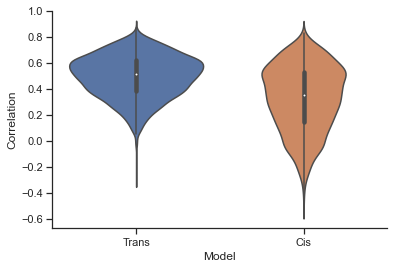

In [14]:
sns.violinplot(data = results.melt(var_name='Model',value_name='Correlation'), x = 'Model', y = 'Correlation')
sns.despine()

In [15]:
results['trans_determination'] = results.Trans - results.Cis
results['trans_determined'] = results.trans_determination > 0.125
results['weak_correlation'] = np.logical_and(results['Cis'] < 0.2, results['Trans'] < 0.2)
results['strongly_trans_determined'] = np.logical_and(results.trans_determination > 0.5, ~results['weak_correlation'])
results['strongly_trans'] = np.logical_and(results['Trans'] > 0.6, results['trans_determined'])
results['strongly_cis'] = np.logical_and(results['Cis'] > 0.6, ~results['trans_determined'])

In [16]:
classes = results[['strongly_trans_determined','strongly_trans','strongly_cis','weak_correlation','trans_determined']].melt(ignore_index = False)
classes = classes[classes.value]

results = results.join(classes.reset_index().drop_duplicates(subset=['index','value'], keep='first').set_index('index').rename(columns = {'variable' : 'class'}).drop(columns=['value'])).fillna('cis_determined')

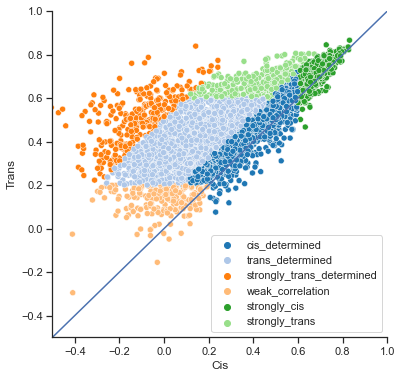

In [17]:
fig, ax = plt.subplots(1,1,figsize = (6,6))
sns.scatterplot(data = results, y = 'Trans', x = 'Cis', ax = ax, hue = results['class'], palette=sns.color_palette('tab20')[:6])
ax.set(xlim=(-0.5,1), ylim=(-0.5,1))
sns.lineplot(x = [-1,1], y = [-1,1], palette='Grays')
sns.despine()

| Category | Enrichment |
|--|--|
| Strongly Cis | Extracellular matrix genes, SOX9-regulated genes (the paper said SOX9 is the master regulator of the system. Perhaps SOX9-related genes are likely to have strong cis-neighborhood effects), Cell-cell adhesion/integrin pathway + mesenchymal stem cell transitions, Hair follicle cell differentiation genes | 
| Srongly Trans | RNA transport (RAN pathway), Ribosomal pathway entry/preprocessing, Nucleus transport |
| Strongly Trans-determined (not necessarily strong Trans but not cis-controlled at all) | Spliceosomal processing, Transportation of mature RNA, mRNA postprocessing, DNA Repair |
| Weakly correlated | Energy metabolism (NAD+, PIP), Lysosomal genes, Golgi biosynthesis genes |

### Bulk Clustering

In [6]:
sc.pp.neighbors(atac_data, use_rep='cell_ilr')
sc.tl.leiden(atac_data, resolution=1)
len(atac_data.obs.leiden.unique())

15

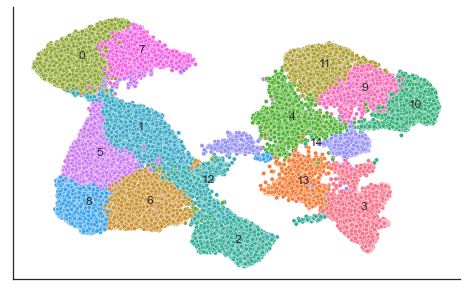

In [7]:
fig, ax = plt.subplots(1,1,figsize = (8,5))
plot_umap(atac_data, color_key=atac_data.obs.leiden.values, palette='tab20', quantitative=False, ax= ax)
for group in atac_data.obs.leiden.values.unique():
    x,y = atac_data[atac_data.obs.leiden == group, :].obsm['X_umap'].mean(axis = 0)
    ax.text(x = x, y = y, s = str(group))
    
plt.show()

In [20]:
gene_expr.obs['atac_leiden'] = atac_data.obs.leiden
sc.tl.rank_genes_groups(gene_expr, use_raw=True, groupby='atac_leiden', method='wilcoxon')

In [21]:
diffgene_sets = {}
for group in gene_expr.obs.atac_leiden.unique():
    group_df = sc.get.rank_genes_groups_df(gene_expr, group=group, pval_cutoff=0.01, log2fc_min=1)    
    gene_names = list(group_df.names.str.upper().values)
    with open(os.path.join('genesets', '{}_diffexpr_genes.txt'.format(str(group))), 'w') as f:
        print('\n'.join(gene_names), file = f)
    diffgene_sets[group] = gene_names

/Users/alynch/miniconda3/envs/torch/lib/python3.8/site-packages/seaborn/distributions.py:1182: UserWarning: No contour levels were found within the data range.
  cset = contour_func(


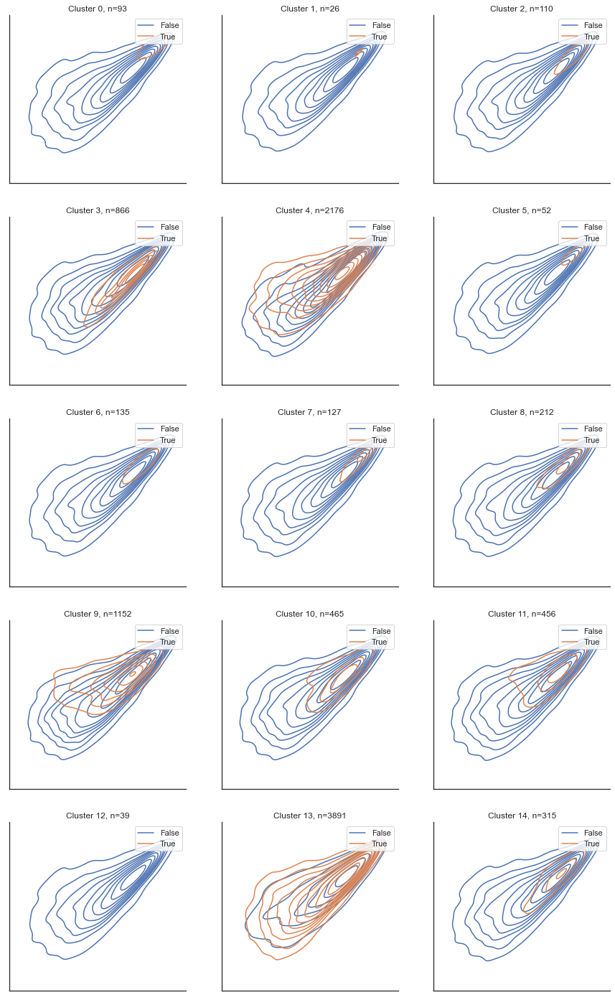

In [22]:
def _plot_(i, ax):
    try:
        sns.kdeplot(data = results, y = 'Trans', x = 'Cis', ax = ax, hue = np.isin(results.index.values, diffgene_sets[str(i)]))
        ax.set(xlim=(-0.5,1), ylim=(-0.2,1), xticks = [], yticks = [], xlabel = None, ylabel = None)
        ax.set(title= 'Cluster {}, n={}'.format(str(i), str(len(diffgene_sets[str(i)]))))
    except Exception:
        pass


map_plot(5,3,_plot_, figsize=(15, 25))
sns.despine()

In [26]:
!mkdir gene_sets

mkdir: gene_sets: File exists


In [112]:
for col in results.columns[3:]:
    with open(os.path.join('genesets', col + '.txt'), 'w') as f:
        print('\n'.join(results[results[col]].index.values), file = f)

In [315]:
from collections import Counter

<AxesSubplot:>

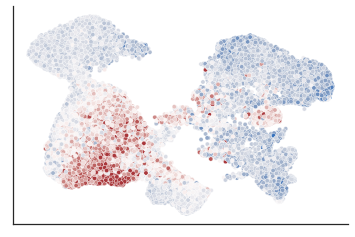

In [943]:
plot_umap(atac_data, color_key=gene_expr[:, 'LRIG1'].layers['imputed'].reshape(-1))

### Add RNA-topic model

### Get variable genes and TFs

In [7]:
motif_data = anndata.read_h5ad('2021-02-01_motif_data.h5ad')
motif_data.obs['factor'] = motif_data.obs['factor_name']
motif_data=motif_data[np.isin(motif_data.obs.factor.values, gene_expr[:, gene_expr.var.deviance_rank < 10000].var.index.values), :]

model_genes = np.logical_or(gene_expr.var.deviance_rank < 5001, np.isin(gene_expr.var.index.values, motif_data.obs.factor.values)).values

raw, encoded = raw_gene_expr[gene_expr[:, model_genes].var.index.values].values.astype(np.float32), np.array(gene_expr[:, model_genes].X).astype(np.float32)

with open('./model_genes.txt', 'w') as f:
    print('\n'.join(gene_expr[:,model_genes].var.index.values), file = f)

sparse.save_npz('./2021-03-19_RNA_raw_sparse.npz', sparse.csr_matrix(raw))
np.save('./2021-03-19_RNA_raw_expr.npy', raw)
np.save('./2021-03-19_RNA_encoded_expr.npy', encoded)
np.save('./2021-03-19_RNA_read_depth.npy', read_depth)

#### >> Model using scVLXCM <<

In [8]:
import importlib
from multiome_models import scLVXCM
scLVXCM = importlib.reload(scLVXCM)

In [9]:
with open('model_genes.txt', 'r') as f:
    modeled_genes = np.array([x.strip() for x in f])

#### Use Expression Model

RNA Models:

Sparse model:
topic_models/scVLXCM/scale-test_10i/2021-03-24_10i_5104g_24t

24 topic dense:
topic_models/scVLXCM/scale-test/2021-03-24_logp_test

ATAC Models

In [10]:
rna_model = scLVXCM.ExpressionModel\
    .get_estimator_from_trace('topic_models/no_test_set_24t/no_train')

In [11]:
expected_expr = pd.DataFrame(rna_model.predict(rna_model.theta/rna_model.theta.sum(-1, keepdims = True)), columns = modeled_genes, index = gene_expr.obs.index)

gene_expr.obsm['cell_distribution'] = rna_model.theta/rna_model.theta.sum(-1, keepdims = True)

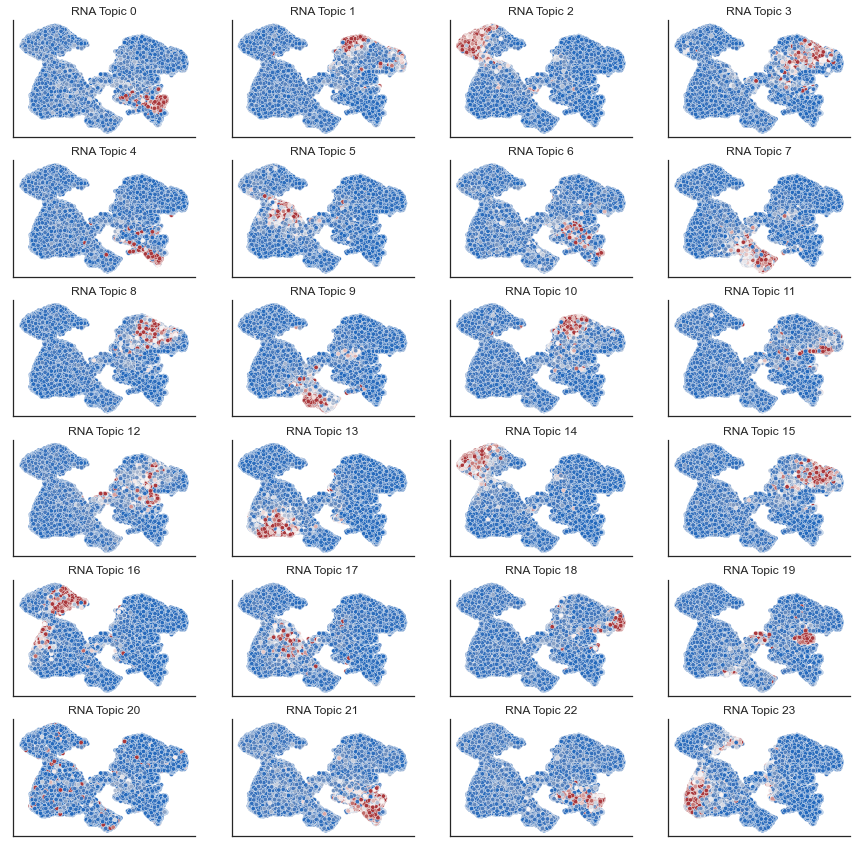

In [12]:
def _plot_(i, ax):
    plot_umap(atac_data, color_key=gene_expr.obsm['cell_distribution'][:, i], ax = ax)
    #plot_umap(atac_data, color_key=t[:, i], ax = ax)
    ax.set(title = 'RNA Topic {}'.format(str(i)))

map_plot(6,4,_plot_,figsize=(15,15))
plt.show()

#### Accessibility Model

In [461]:
sparse.save_npz('./2021-04-11_atac_matrix.npz', atac_data.X.tocsr())

In [13]:
access_model = scLVXCM.ExpressionModel.get_estimator_from_trace('./topic_models/no_test_set_24t/2021-03-25_atac_10i_24t_no_test')
atac_data.obsm['cell_distribution_24']=access_model.theta/access_model.theta.sum(-1,keepdims=True)

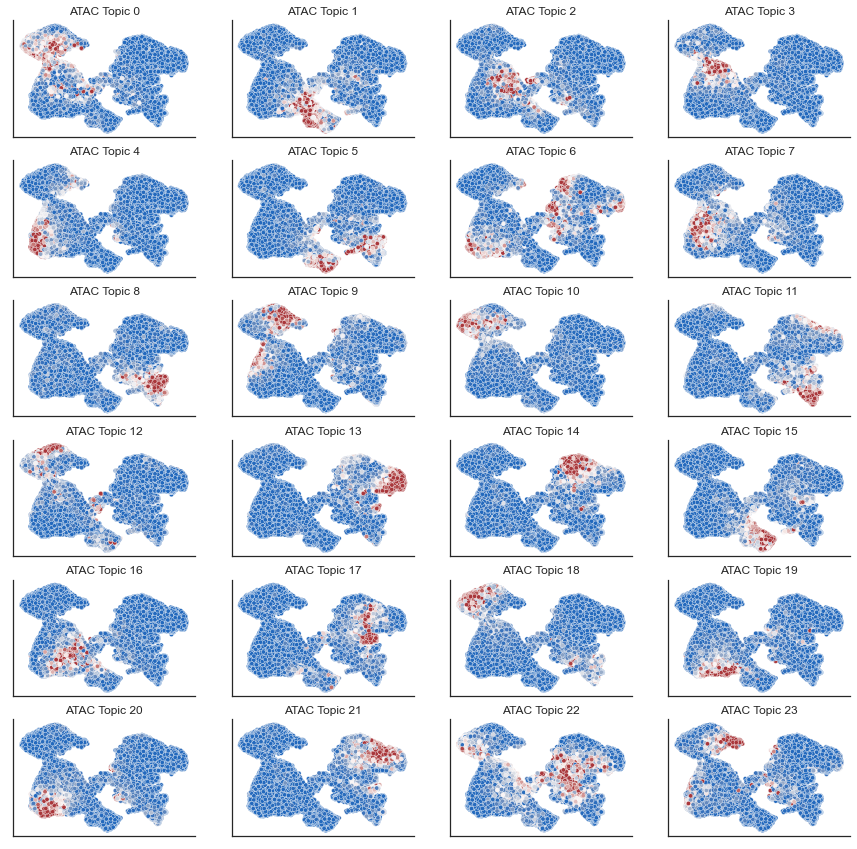

In [14]:
def _plot_(i, ax):
    plot_umap(atac_data, color_key=atac_data.obsm['cell_distribution_24'][:, i], ax = ax)
    #plot_umap(atac_data, color_key=t[:, i], ax = ax)
    ax.set(title = 'ATAC Topic {}'.format(str(i)))

map_plot(6,4,_plot_,figsize=(15,15))
plt.show()

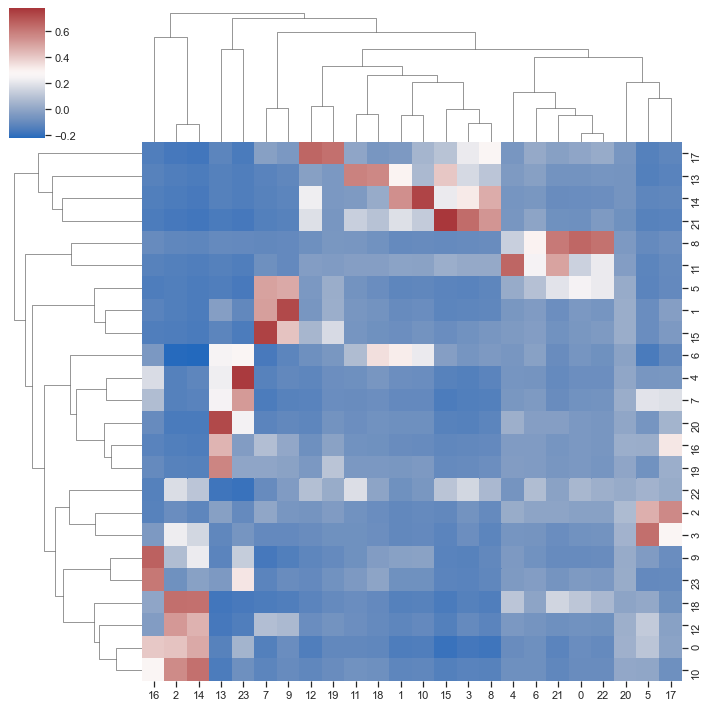

In [15]:
topic_corrs = np.corrcoef(atac_data.obsm['cell_distribution_24'], gene_expr.obsm['cell_distribution'], rowvar=False)
topic_corrs = topic_corrs[:24,24:]
sns.clustermap(topic_corrs, cmap='vlag', figsize=(10,10))

In [16]:
gene_expr.obsm['cell_ilr'] = 1.5*ilr(gene_expr.obsm['cell_distribution'])
atac_data.obsm['cell_ilr'] = ilr(atac_data.obsm['cell_distribution_24'])
gene_expr.obsm['joint'] = np.hstack([gene_expr.obsm['cell_ilr'], atac_data.obsm['cell_ilr']])

In [17]:
sc.pp.neighbors(gene_expr, use_rep='joint', key_added='joint')
sc.tl.umap(gene_expr, min_dist=0.1, neighbors_key='joint')

<AxesSubplot:>

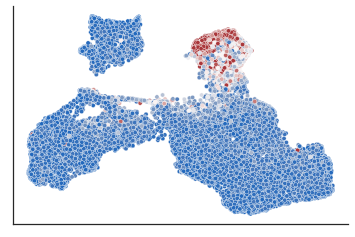

In [18]:
plot_umap(gene_expr, color_key=gene_expr.obsm['cell_distribution'][:,7], quantitative=True)

#### RNA Topic Annotation

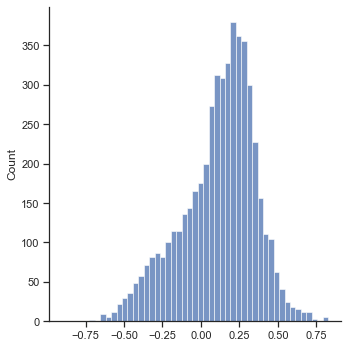

In [75]:
TOPIC = 1
sns.displot(rna_model.beta[TOPIC,:])

In [76]:
#topic_genes = np.intersect1d(modeled_genes[rna_model.beta[TOPIC,:].argsort()[-200:]], results[results.Cis > 0.2].index.values)
topic_genes = modeled_genes[rna_model.beta[TOPIC,:].argsort()[-200:]]
len(topic_genes)

200

In [77]:
rna_model.beta[:,np.argwhere(modeled_genes == 'WNT3')[0,0]].argsort()

array([22, 13, 23, 21, 20, 17,  8,  5, 12, 15,  4, 16,  2, 14,  0, 10,  3,
       19,  1,  6,  9,  7, 18, 11])

In [78]:
print(*sorted(topic_genes), sep = '\n')

1190002N15RIK
2410002F23RIK
4833439L19RIK
5031439G07RIK
ABHD17C
ACAA2
ACTN4
AFTPH
AGO1
AGPAT3
ANKRD13A
APLP2
ARAP2
ARF1
ARHGAP23
ARHGAP42
ARHGEF1
ATAD2B
ATL2
ATP6V1D
ATP7A
AVEN
B4GALNT3
BAZ2B
BIN3
BMP7
BRAF
BTG1
CASC3
CCDC186
CCZ1
CDC14A
CDH6
CEBPB
CELSR1
CHMP2A
CHMP4B
CNKSR3
COG2
CPM
CPT1A
CSGALNACT1
CSNK1E
CTPS
CTSC
CUL2
D930015E06RIK
DAAM1
DAPL1
DCAF6
DCTN2
DOCK4
DSC1
DSG4
DTD1
EFTUD1
EIF3E
EPB41L1
EPHA2
ERC1
ESRP2
FAM126B
FARP2
FARSB
FBXO7
FOXO3
FRS2
GATA3
GBF1
GFOD1
GPATCH1
GRAMD1B
GRHL3
HADH
HEPHL1
HIBADH
HOOK3
HOXC13
ID2
INTS10
INTS9
IRF6
ITM2B
JAG1
KCNH1
KDM5C
KIF1B
KRT25
KRT28
KRT35
KRT71
KRT73
LGALS7
LRRC16A
LYST
MAF
MAGI3
MAML3
MAPRE3
MARK1
MBNL2
MCTS1
MDFIC
MED12
MED14
MED27
MGST1
MICAL3
MIOS
MTMR3
MYH14
MYO10
NEO1
NFE2L3
NOTCH1
NRG3
NUDT13
OSR2
PAN3
PAQR5
PARL
PDCD4
PIK3C3
PIK3R3
PITPNC1
PLXNA1
PNPLA6
PPFIA1
PPFIBP1
PTBP3
PTPN11
PTPRE
PUS10
QARS
RAB11FIP2
RARS2
RB1
RBM47
REPS1
RFWD2
RNF145
RNF180
ROR1
RUNX1
S100A16
SAMD4
SASH1
SCUBE2
SFN
SHB
SIPA1L1
SIPA1L3
SLC39A8
SLC44A1

<AxesSubplot:>

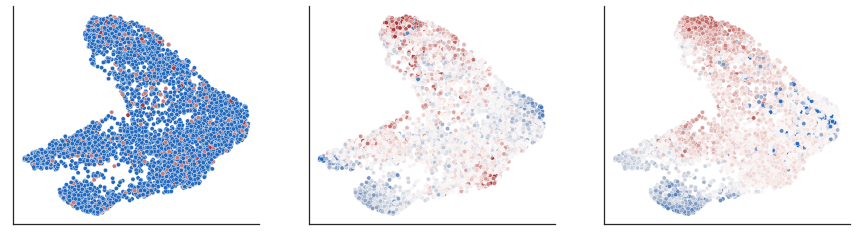

In [84]:
_gene = 'SMAD3'

fig,ax = plt.subplots(1,3,figsize=(15,4)) 
plot_umap(cortex_data, color_key=raw_gene_expr.iloc[cortex_mapping][_gene].values, ax = ax[0]) 
plot_umap(cortex_data, color_key=cortex_data[:, _gene].layers['imputed'].reshape(-1), ax = ax[1])
plot_umap(cortex_data, color_key=expected_expr.loc[cortex_data.obs.index][_gene], ax = ax[2])

#### ATAC Topic Annotation

In [144]:
topic_associated_peaks = access_model.beta[6, :] >= np.quantile(access_model.beta[6,:], 0.93)

In [140]:
topic_associated_peaks.sum()

12999

In [81]:
with open('gene_sets/topic_13_peaks.bed','w') as f:
    for line in atac_data[:,peak_mask][:, topic_associated_peaks].var[['chr','start','end']].values.tolist():
        print(*line, sep = '\t', file = f)

In [82]:
from scipy.stats import fisher_exact

In [88]:
motif_matrix = motif_data[:, peak_mask].X.tocsr()

In [145]:
pvals = []
topic_idx = np.arange(len(topic_associated_peaks))[topic_associated_peaks]
n_peaks = access_model.beta.shape[-1]
for i in tqdm.tqdm(range(motif_data.shape[0])):
    hit_idx = motif_matrix[i,:].indices
    both = len(np.intersect1d(hit_idx, topic_idx))
    topic_only = len(topic_idx) - both
    motif_only = len(hit_idx) + len(topic_idx) - topic_only - 2*both
    neither = n_peaks - (both + topic_only + motif_only)
    conting_matrix = np.array([[both, topic_only], [motif_only, neither]])
    stat,pval = fisher_exact(conting_matrix, alternative='greater')
    pvals.append(pval)

100%|██████████| 741/741 [00:01<00:00, 460.55it/s]


In [146]:
pvals = pd.Series(pvals, index = motif_data.obs.factor_name.values)

In [147]:
pvals.sort_values().head(50)

KLF15            8.382342e-100
ZBTB14            1.064643e-72
SP4               3.674758e-65
SP3               3.270488e-64
KLF3              2.977384e-63
NRF1              2.009604e-59
KLF14             4.441938e-58
EGR1              5.064422e-57
SP9               6.100633e-57
TFDP1             2.576247e-55
CTCFL             8.204096e-54
SP1               2.061334e-52
KLF5              5.505947e-51
KLF11             1.884247e-48
KLF2              2.460450e-48
CTCF              3.513707e-47
ZNF460            7.188816e-44
HINFP             2.326328e-41
KLF6              3.870400e-41
KLF4              5.774848e-41
EGR3              9.043225e-40
Klf12             2.559403e-39
ZNF148            5.083294e-39
KLF16             2.365006e-38
ZBTB33            8.527527e-38
SP8               2.320664e-36
YY2               1.470362e-35
KLF10             6.784927e-35
Plagl1            8.676857e-34
EGR2              2.155357e-33
ZIC5              2.020872e-31
TCFL5             2.360826e-30
Zfx     

# Pseudotime / Expr Topic Modeling

In [24]:
cortex_data = gene_expr[np.isin(atac_data.obs.leiden, ['11','9','10']), :].copy()

sc.pp.neighbors(cortex_data, n_neighbors=10, use_rep='joint')
sc.tl.leiden(cortex_data, resolution=1)

In [25]:
sc.tl.umap(cortex_data, n_components=3, min_dist=0.1)

In [26]:
cortex_mapping = atac_data.obs.reset_index().reset_index().set_index('barcode').loc[cortex_data.obs.index]['index'].values
cortex_data.obsm['atac_composition'] = atac_data[cortex_data.obs.index, :].obsm['cell_distribution_24']
cortex_data.obsm['atac_composition_16'] = atac_data[cortex_data.obs.index, :].obsm['cell_distribution']

<AxesSubplot:>

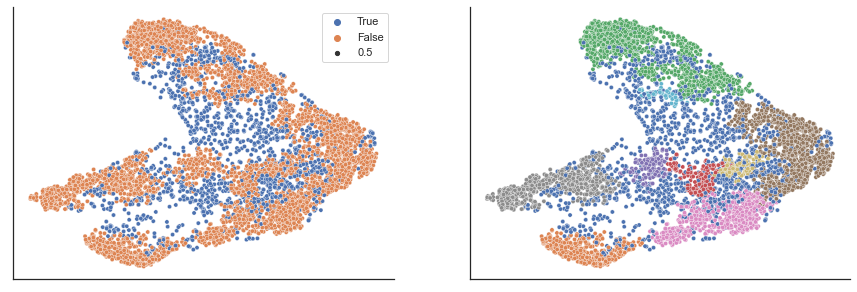

In [22]:
from sklearn.cluster import OPTICS,DBSCAN

cortex_data.obs['dbscan'] = DBSCAN(0.222, min_samples = 7).fit_predict(cortex_data.obsm['X_umap'])
cortex_data.obs.dbscan.unique()

cortex_data.obs.dbscan = np.where(cortex_data.obs.dbscan.map(cortex_data.obs.groupby('dbscan').count()['n_genes'] > 42).values, cortex_data.obs.dbscan.values, -1)

fig,ax = plt.subplots(1,2,figsize=(15,5))
plot_umap(cortex_data, color_key=cortex_data.obs.dbscan.values == -1, quantitative=False, legend=True, ax = ax[0])
plot_umap(cortex_data, color_key=cortex_data.obs.dbscan.values.astype(np.str), quantitative=False, legend=False, ax= ax[1], palette='tab20', hue_order=sorted(np.unique(cortex_data.obs.dbscan.values).astype(np.str)))

<AxesSubplot:>

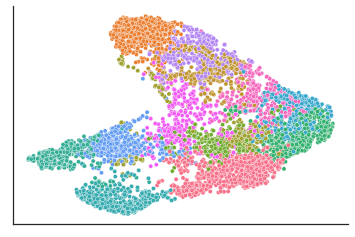

In [23]:
plot_umap(cortex_data, color_key=cortex_data.obs.leiden.values, quantitative=False, legend=False, hue_order = sorted(cortex_data.obs.leiden.unique()))#color_key=np.array(gene_expr[cortex_data.obs.index, 'TRP63'].layers['imputed']).reshape(-1))

<AxesSubplot:>

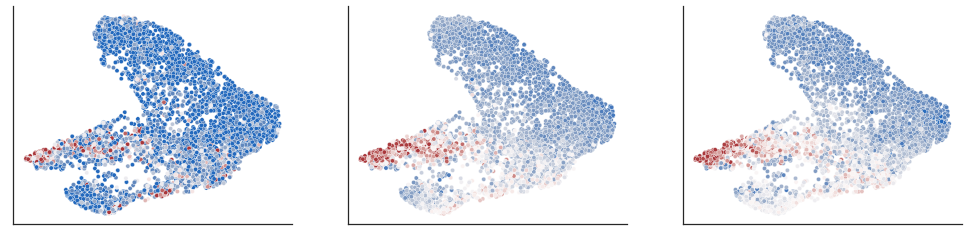

In [57]:
_gene = 'LEF1'

fig,ax = plt.subplots(1,3,figsize=(17,4)) 
plot_umap(cortex_data, color_key=raw_gene_expr.iloc[cortex_mapping][_gene].values, ax = ax[0]) 
plot_umap(cortex_data, color_key=cortex_data[:, _gene].layers['imputed'].reshape(-1), ax = ax[1])
plot_umap(cortex_data, color_key=expected_expr.loc[cortex_data.obs.index][_gene], ax = ax[2])

In [25]:
def entrop(x):
    return -np.sum(x * np.log(x), -1)

In [47]:
import plotly.express as px

threeD_data = pd.DataFrame(cortex_data.obsm['X_umap'])
#threeD_data['cluster'] = gene_expr[cortex_data.obs.index, 'LEF1'].layers['imputed'].reshape(-1)#cortex_data.obsm['atac_compositions'][:,7]#cortex_data.obs.leiden.values
threeD_data['cluster'] = cortex_data.obsm['cell_distribution'][:,1]
#threeD_data['cluster'] = cortex_data.obs.dbscan.values
#threeD_data['cluster'] = entrop(cortex_data.obsm['cell_distribution'])
px.scatter_3d(threeD_data, x = 0, y= 1, z= 2, size_max=1, color='cluster')

# Slingshot analysis

In [28]:
cortex_data.obs.leiden = cortex_data.obs.leiden.astype(str)

In [29]:
for cluster, count in zip(*np.unique(cortex_data.obs.leiden.values, return_counts=True)):
    if count < 48:
        x = cortex_data.obs.leiden.values
        cortex_data.obs.leiden = np.where(x == cluster, '-1', x)

In [405]:
cortex_data.obs.leiden = np.where(cortex_data.obs.leiden.values == '11', '-1', cortex_data.obs.leiden.values)
cortex_data.obs.leiden = np.where(cortex_data.obs.leiden.values == '8', '-1', cortex_data.obs.leiden.values)

In [381]:
cortex_data.obs['entropy'] = entrop(cortex_data.obsm['cell_distribution']) + entrop(cortex_data.obsm['atac_composition'])

In [749]:
np.savetxt('cortex_pseudotime/cortex_clr.txt', np.hstack([ilr(cortex_data.obsm['cell_distribution']), ilr(cortex_data.obsm['atac_composition'])]))
np.savetxt('cortex_pseudotime/cortex_umap.txt', cortex_data.obsm['X_umap'])

with open('cortex_pseudotime/cortex_cluster.txt', 'w') as f:
    print(*cortex_data.obs.dbscan.values, sep = '\n', file=f)

print(*cortex_data.obs.dbscan.unique())

-1 0 1 7 2 3 4 5 12 6 18 19


$Lineage1 CORTEX
[1] "4" "7" "1" "6" "9"

$Lineage2 IRS
[1] "4" "5" "8" "0"

$Lineage3 MEDULLA
[1] "4" "7" "1" "2"

$Lineage4
[1] "4"  "5"  "8"  "11"

$Lineage5
[1] "4"  "5"  "10"

### Pseudotime analysis

In [27]:
pseudotime = pd.read_csv('cortex_pseudotime/cortex_pseudotime.csv').drop(columns = ['Unnamed: 0'])
cortex_data.obs[pseudotime.columns] = pseudotime[pseudotime.columns].values

[Text(0.5, 1.0, 'RNA IRS')]

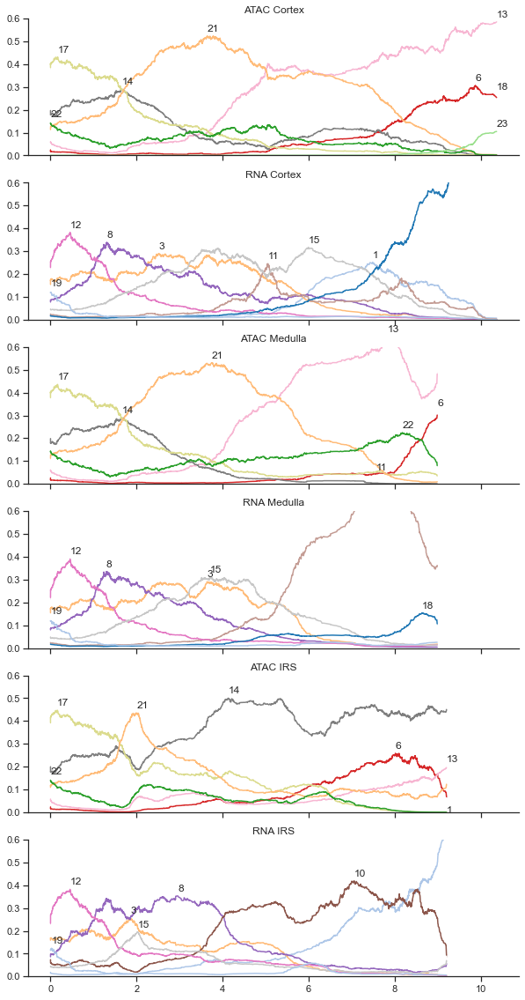

In [28]:
def smooth(y, box_pts):
    box = np.ones(box_pts)/box_pts
    y_smooth = np.convolve(y, box, mode='valid')
    return y_smooth

def get_lineage(data, curve_name, rep = 'atac_composition'):
    
    data = data[~data.obs[curve_name].isna(), :]
    
    time = data.obs[curve_name].values
    compositions = data.obsm[rep]
    
    order = np.argsort(time)
    
    return time[order], compositions[order]


def draw_lineage(data, curve_name, rep = 'atac_composition', ax = None):
    
    data = data[~data.obs[curve_name].isna(), :]
    
    time = data.obs[curve_name].values
    compositions = data.obsm[rep]
    
    order = np.argsort(time)
    
    #time_bins = pd.cut(time[order], 50, retbins=False, labels=np.arange(50))
    time = time[order]
    
    for i, comp in enumerate(compositions.T):
        
        comp = smooth(np.pad(comp[order],(0,99),'edge'), 100)
        
        if comp.max() > 0.1:
            
            sns.lineplot(x = time, y = comp, ci = 95, ax = ax, legend = 'full', color=sns.color_palette('tab20')[i % 18])

            max_comp_idx = np.argmax(comp)
            max_comp = comp[max_comp_idx]
            max_comp_time = time[max_comp_idx]

            ax.text(x = max_comp_time, y = max_comp+0.02, s = str(i))
        #sns.lineplot(x = time[order], y = , ax = ax)
    
    ax.set(ylim = (0,0.6))
        
    sns.despine()

fig, ax = plt.subplots(6,1,figsize=(10,20), sharex=True)
draw_lineage(cortex_data, 'curve1', rep = 'atac_composition', ax = ax[0])
draw_lineage(cortex_data, 'curve1', rep = 'cell_distribution', ax = ax[1])
ax[0].set(title = 'ATAC Cortex')
ax[1].set(title = 'RNA Cortex')
draw_lineage(cortex_data, 'curve3', rep = 'atac_composition', ax = ax[2])
draw_lineage(cortex_data, 'curve3', rep = 'cell_distribution', ax = ax[3])
ax[2].set(title = 'ATAC Medulla')
ax[3].set(title = 'RNA Medulla')
draw_lineage(cortex_data, 'curve2', rep = 'atac_composition', ax = ax[4])
draw_lineage(cortex_data, 'curve2', rep = 'cell_distribution', ax = ax[5])
ax[4].set(title = 'ATAC IRS')
ax[5].set(title = 'RNA IRS')

In [515]:
import matplotlib.pyplot as plt

In [558]:
help(plt.fill_between)

Help on function fill_between in module matplotlib.pyplot:

fill_between(x, y1, y2=0, where=None, interpolate=False, step=None, *, data=None, **kwargs)
    Fill the area between two horizontal curves.
    
    The curves are defined by the points (*x*, *y1*) and (*x*,
    *y2*).  This creates one or multiple polygons describing the filled
    area.
    
    You may exclude some horizontal sections from filling using *where*.
    
    By default, the edges connect the given points directly.  Use *step*
    if the filling should be a step function, i.e. constant in between
    *x*.
    
    Parameters
    ----------
    x : array (length N)
        The x coordinates of the nodes defining the curves.
    
    y1 : array (length N) or scalar
        The y coordinates of the nodes defining the first curve.
    
    y2 : array (length N) or scalar, default: 0
        The y coordinates of the nodes defining the second curve.
    
    where : array of bool (length N), optional
        Define *

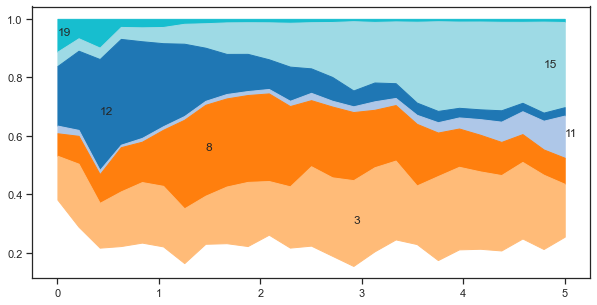

In [668]:
def draw_lineage(data, curve_name, rep = 'atac_composition', ax = None, ticks = 25, start = 0, end = np.inf):
    
    data = data[~data.obs[curve_name].isna(), :]
    
    time = data.obs[curve_name].values
    include_points = np.logical_and(start <= time, time <= end)
    
    time = time[include_points]
    compositions = data.obsm[rep][include_points]
    
    time_bins = pd.cut(time, ticks, retbins=False, labels=np.linspace(time.min(), time.max(), ticks))
    bin_ticks = np.sort(np.unique(time_bins))
    
    tick_means = np.vstack([compositions[time_bins == tick].mean(0) for tick in bin_ticks])
    include_topic = tick_means.max(0) > 0.1
    tick_means = np.hstack([tick_means[:, ~include_topic].sum(-1, keepdims=True), tick_means[:, include_topic]])
    tick_means/=tick_means.sum(-1, keepdims = True)
    fillareas = np.cumsum(tick_means, -1)
    
    for i in range(fillareas.shape[-1], 1, -1):
        ax.fill_between(bin_ticks, fillareas[:,i-1], fillareas[:, i-2], color = sns.color_palette('tab20')[((~include_topic).sum() + fillareas.shape[-1] - i) % 20])
    
    max_idx = tick_means.argmax(0)[1:]
    
    topic_nums = np.arange(compositions.shape[-1])[include_topic]
    for i,(x,name) in enumerate(zip(max_idx, topic_nums)):
        y = (fillareas[x,i+1] + fillareas[x,i])/2
        ax.text(x = bin_ticks[x], y = y, s = str(name))
        #print()
    
    
fig, ax = plt.subplots(1,1,figsize=(10,5), sharex=True)
areas = draw_lineage(cortex_data, 'curve3', rep = 'cell_distribution', ax = ax, start = 0, end = 5)

In [ ]:
class Node:
    
    @classmethod
    def plot_path(cls, adata, path, ax, skip_topics=[], rep = 'cell_distribution', topic_ordering = None, color_cycler = 0):
        
        tick_means, bin_ticks, height =[],[],[]
        for i, node in enumerate(path):
            a,b,c = node.get_fill_areas(adata, rep = rep)
            tick_means.append(a)
            bin_ticks.append(b + i*0.1)
            height.append(c)
            root = False
            
        tick_means, bin_ticks, height = list(map(lambda x : np.concatenate(x, 0), [tick_means, bin_ticks, height]))
        
        K = tick_means.shape[-1]
        
        if topic_ordering is None:
            topic_nums = np.arange(K)
        else:
            topic_nums = np.concatenate([topic_ordering, np.setdiff1d(np.arange(K), topic_ordering)])
            
        tick_means = tick_means[:, topic_nums]
        
        include_topic = tick_means.max(0) > 0.1
        tick_means = np.hstack([tick_means[:, ~include_topic].sum(-1, keepdims=True), tick_means[:, include_topic]])
        tick_means/=tick_means.sum(-1, keepdims = True)
        fillareas = np.cumsum(tick_means, -1) 
        fillareas = fillareas + height[:, np.newaxis]*1.5 - fillareas[:,0][:,np.newaxis]/2
        
        topic_nums = topic_nums[include_topic]
        for i in range(fillareas.shape[-1], 1, -1):
            ax.fill_between(bin_ticks, fillareas[:,i-1], fillareas[:, i-2], color = sns.color_palette('tab20')[(topic_nums[i - 2] + color_cycler) % 20])
            
        max_idx = tick_means.argmax(0)[1:]
        for i,(x,name) in enumerate(zip(max_idx, topic_nums)):
            if not name in skip_topics:
                y = (fillareas[x,i+1] + fillareas[x,i])/2
                ax.text(x = bin_ticks[x], y = y - 0.05, s = str(name))
                
        return topic_nums                               
    
    def __init__(self, curve, start = 0, end = np.inf, height = 0):
        self.curve = curve
        self.start = start
        self.end = end
        self.children = []
        self.height = height
        self.visited = False
        
    def plot_paths(self, adata, ax, topic_ordering = None, rep = 'cell_distribution', color_cycler = 0):
            
        annotated_topics = []
        for path in self.get_all_paths():
            annotated_topics.extend(
                self.plot_path(adata, path, ax, skip_topics=annotated_topics, topic_ordering=topic_ordering, rep = rep, color_cycler = color_cycler)
            )
            
        ax.set(xlabel = 'Pseudotime')
        sns.despine()
        ax.set(yticks = [])
                               
    def is_leaf(self):
        return len(self.children) == 0
        
    def add_child(self, curve, start = 0, end = np.inf, height = 0):
        new_node = Node(curve, start, end, height = height)
        self.children.append(new_node)
        return new_node
        
    def get_fill_areas(self, adata, ticks = 30, rep = 'cell_distribution'):
        
        data = adata[~adata.obs[self.curve].isna(), :]
    
        time = data.obs[self.curve].values
        include_points = np.logical_and(self.start <= time, time <= self.end)

        time = time[include_points]
        compositions = data.obsm[rep][include_points]

        time_bins = pd.cut(time, ticks, retbins=False, labels=np.linspace(time.min(), time.max(), ticks))
        bin_ticks = np.sort(np.unique(time_bins))

        tick_means = np.vstack([compositions[time_bins == tick].mean(0) for tick in bin_ticks])
        
        #tick means, x, height
        return tick_means, bin_ticks, np.repeat(self.height, len(tick_means))
    
    def get_all_paths(self):
        
        if self.is_leaf():
            return [[self,]]
        else:
            paths = []
            for child in self.children:
                for path in child.get_all_paths():
                    paths.append([self, *path])
                    
            return paths

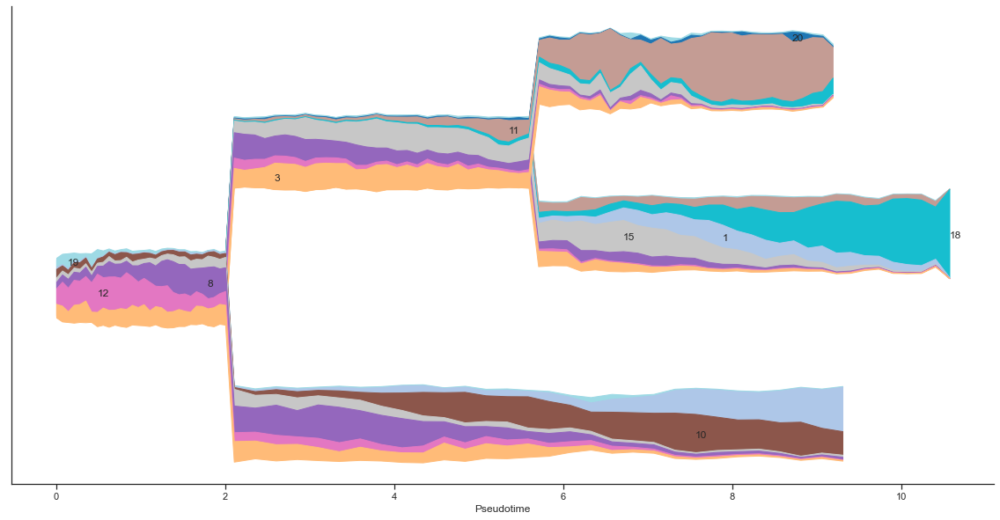

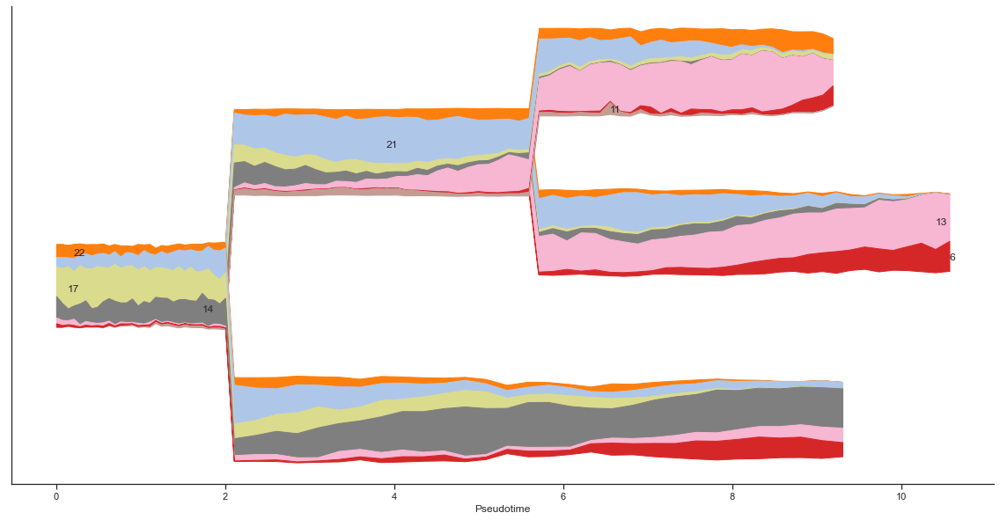

In [937]:
root = Node('curve1', 0, 2)
branch = root.add_child('curve1', 2, 5.5, height = 1)
branch.add_child('curve1',5.5, height = 0.4)
branch.add_child('curve3',5.5, height = 1.6)
root.add_child('curve2',2, height = -1)

fig, ax = plt.subplots(1,1,figsize=(20,10), sharex=True)
root.plot_paths(cortex_data, ax = ax, color_cycler=0, topic_ordering = np.array([3,12,8,15,10,1,18,11,20]))
plt.savefig('rna_streamplot.png')

fig, ax = plt.subplots(1,1,figsize=(20,10), sharex=True)
root.plot_paths(cortex_data, ax = ax, color_cycler=0, rep = 'atac_composition', topic_ordering = np.array([3,12,8,15,10,1,18,11,20]))
plt.savefig('atac_streamplot.png')

# TAD Analysis

# Latent Accessibility Analysis

In [32]:
tolerance = 0.15
timepoint_barcodes = [] 
#CORTEX
for i in np.linspace(0, cortex_data.obs['curve1'].dropna().max(), 30):
    curve_data = cortex_data.obs['curve1'].dropna()
    timepoint_barcodes.append( curve_data[np.logical_and(curve_data <(i+tolerance), curve_data > (i-tolerance))].index.values )
    
#MEDULLA
for i in np.linspace(4, cortex_data.obs['curve3'].dropna().max(), 20):
    curve_data = cortex_data.obs['curve3'].dropna()
    timepoint_barcodes.append( curve_data[np.logical_and(curve_data <(i+tolerance), curve_data > (i-tolerance))].index.values )

#IRS
for i in np.linspace(0, cortex_data.obs['curve2'].dropna().max(), 20):
    curve_data = cortex_data.obs['curve2'].dropna()
    timepoint_barcodes.append( curve_data[np.logical_and(curve_data <(i+tolerance), curve_data > (i-tolerance))].index.values )

In [33]:
rna_states = np.vstack([cortex_data[barcodes].obsm['cell_distribution'].mean(0)[np.newaxis,:] for barcodes in timepoint_barcodes])
atac_states = np.vstack([cortex_data[barcodes].obsm['atac_composition'].mean(0)[np.newaxis,:] for barcodes in timepoint_barcodes])
old_atac_states = np.vstack([cortex_data[barcodes].obsm['atac_composition_16'].mean(0)[np.newaxis,:] for barcodes in timepoint_barcodes])

In [34]:
rna_state_predictions = pd.DataFrame(rna_model.predict(rna_states), columns = modeled_genes)

In [35]:
#medulla_timepoints = np.array(list(range(50//4)) + list(range(50,50+30-1)))
#cortex_timepoints = np.arange(50)
#irs_timepoints = np.array(list(range(80, 110)))
cortex_timepoints = np.arange(30)
medulla_timepoints = np.concatenate([np.arange(30//4), np.arange(30,50)])
irs_timepoints = np.arange(50,70)

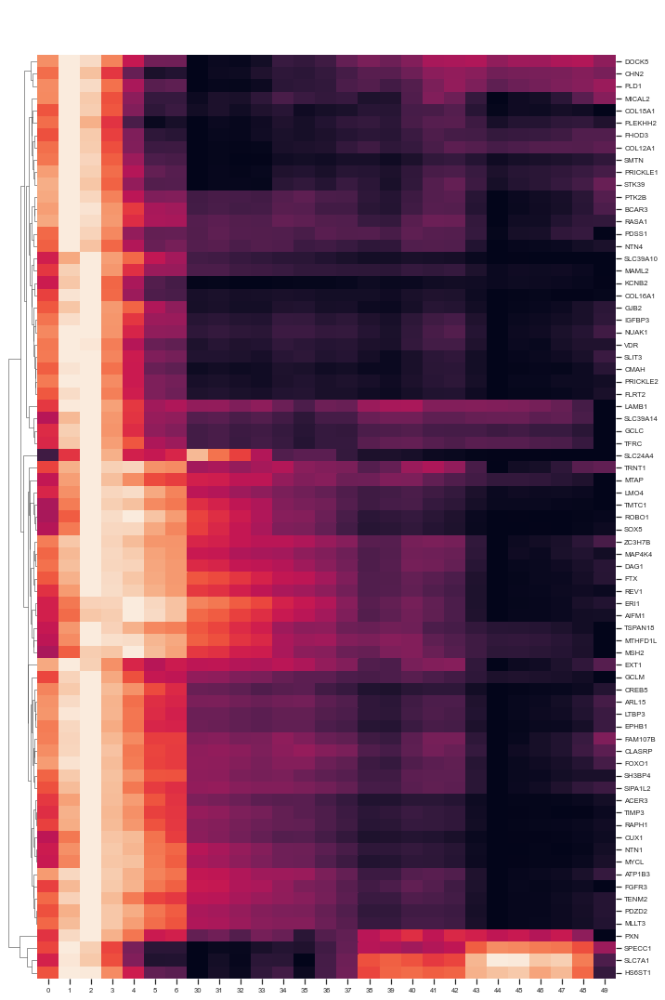

In [36]:
cortex_genes = rna_model.beta[12,:].argsort()[-75:]
data = rna_state_predictions.iloc[:, cortex_genes].T.iloc[:,medulla_timepoints]
sns.set(style = 'ticks', font_scale = 0.7)
sns.clustermap(data, col_cluster=False, standard_scale=0, figsize=(10,15), cbar_pos=None, dendrogram_ratio=0.05)

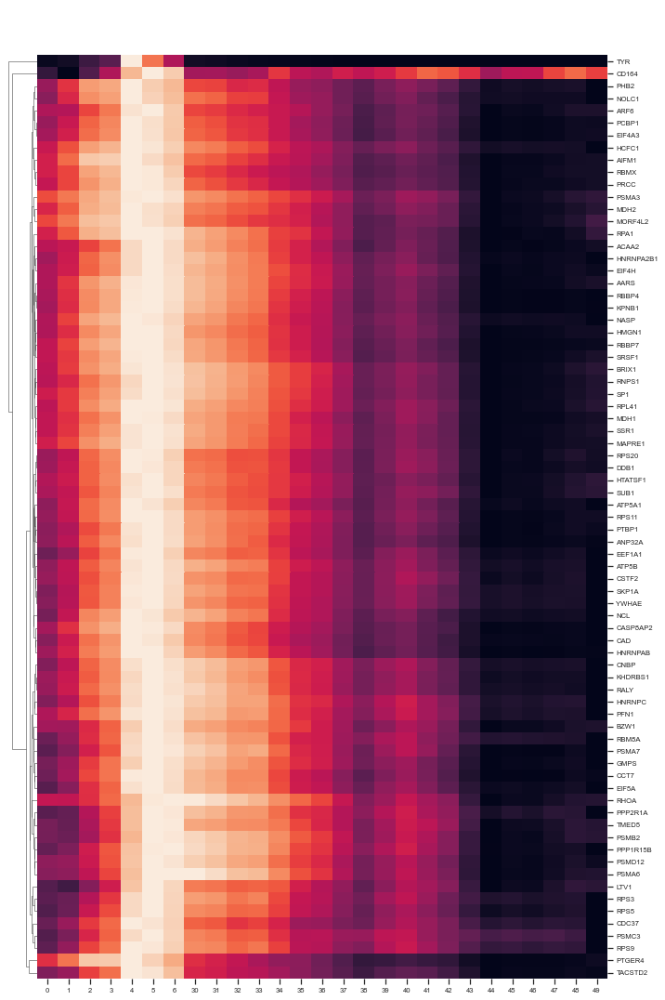

In [37]:
cortex_genes = rna_model.beta[8,:].argsort()[-75:]
data = rna_state_predictions.iloc[:, cortex_genes].T.iloc[:,medulla_timepoints]
sns.set(style = 'ticks', font_scale = 0.7)
sns.clustermap(data, col_cluster=False, standard_scale=0, figsize=(10,15), cbar_pos=None, dendrogram_ratio=0.05)

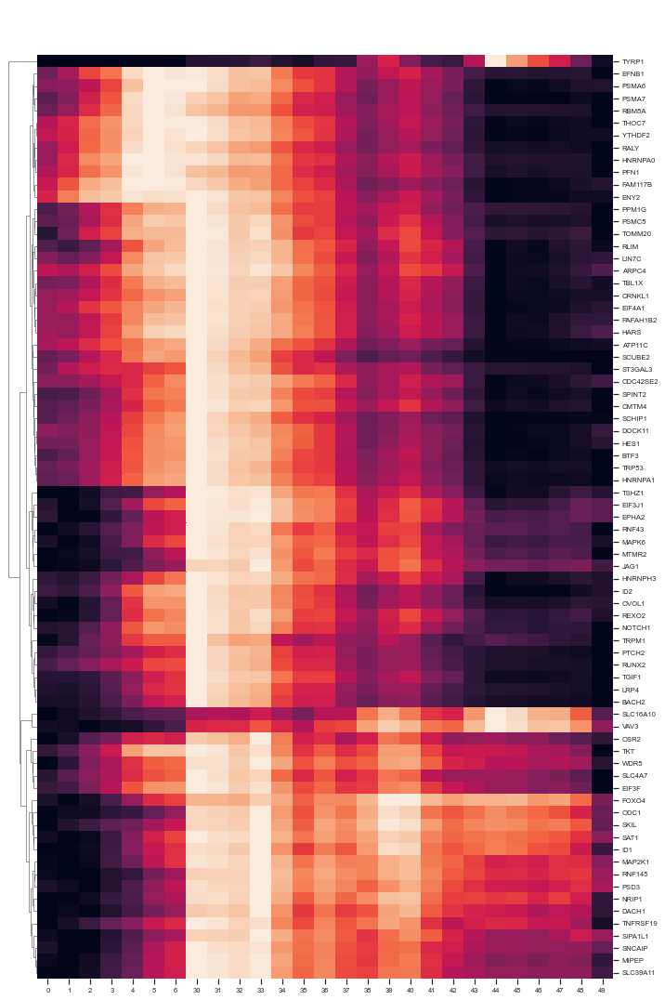

In [38]:
cortex_genes = rna_model.beta[15,:].argsort()[-75:]
data = rna_state_predictions.iloc[:, cortex_genes].T.iloc[:,medulla_timepoints]
sns.set(style = 'ticks', font_scale = 0.7)
sns.clustermap(data, col_cluster=False, standard_scale=0, figsize=(10,15), cbar_pos=None, dendrogram_ratio=0.05)

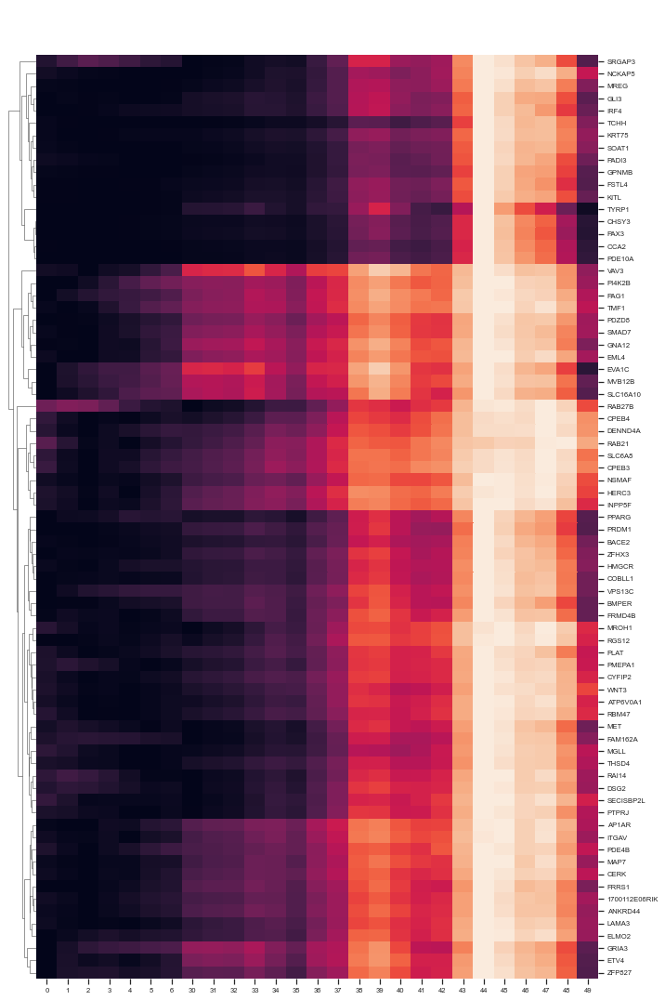

In [39]:
cortex_genes = rna_model.beta[11,:].argsort()[-75:]
data = rna_state_predictions.iloc[:, cortex_genes].T.iloc[:,medulla_timepoints]
sns.set(style = 'ticks', font_scale = 0.7)
sns.clustermap(data, col_cluster=False, standard_scale=0, figsize=(10,15), cbar_pos=None, dendrogram_ratio=0.05)

### Motif Analysis

In [40]:
atac_state_predictions = access_model.predict(atac_states)[:, lisa_test.region_score_map]

In [41]:
atac_state_predictions = np.dot(old_atac_states, atac_data.varm['region_distribution'].T)[:, peak_mask][:, lisa_test.region_score_map]

In [42]:
motif_state_predictions = np.vstack([
    np.log(atac_state_predictions[:, motif_matrix[i, :].indices]).sum(-1)[np.newaxis, :]    
    for i in range(motif_matrix.shape[0])
])

In [43]:
topic_motif_corrs = pd.DataFrame(np.corrcoef(clr(atac_states).T, motif_state_predictions, rowvar=True)[:24,24:], columns = motif_data.obs.factor).T

In [44]:
motif_state_predictions = pd.DataFrame(motif_state_predictions, index = motif_data.obs.factor.values)

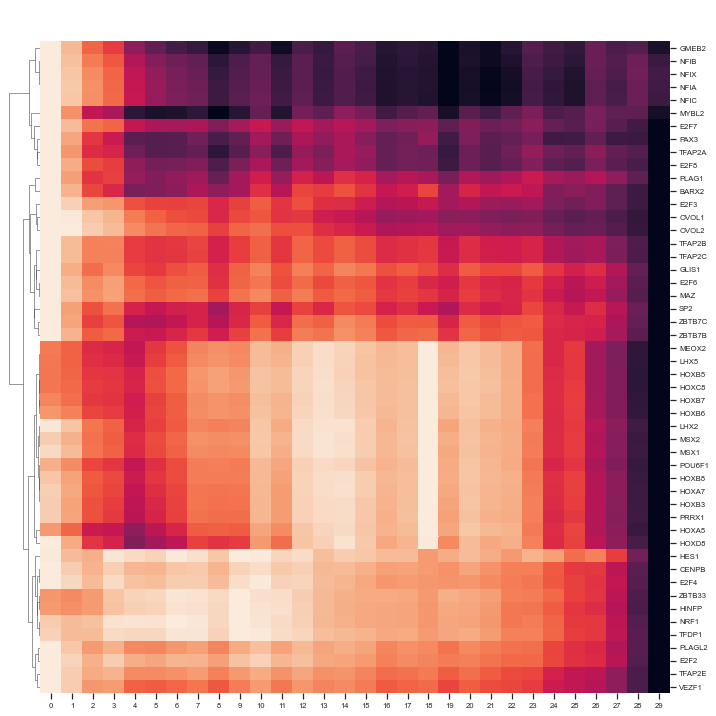

In [45]:
_TOPIC_=17
sns.clustermap(motif_state_predictions[motif_data.obs.factor.str.upper().isin(modeled_genes).values].iloc[topic_motif_corrs[_TOPIC_].values.argsort()[-50:]].iloc[:,cortex_timepoints], col_cluster=False,cbar_pos = None, standard_scale=0, dendrogram_ratio=0.05)

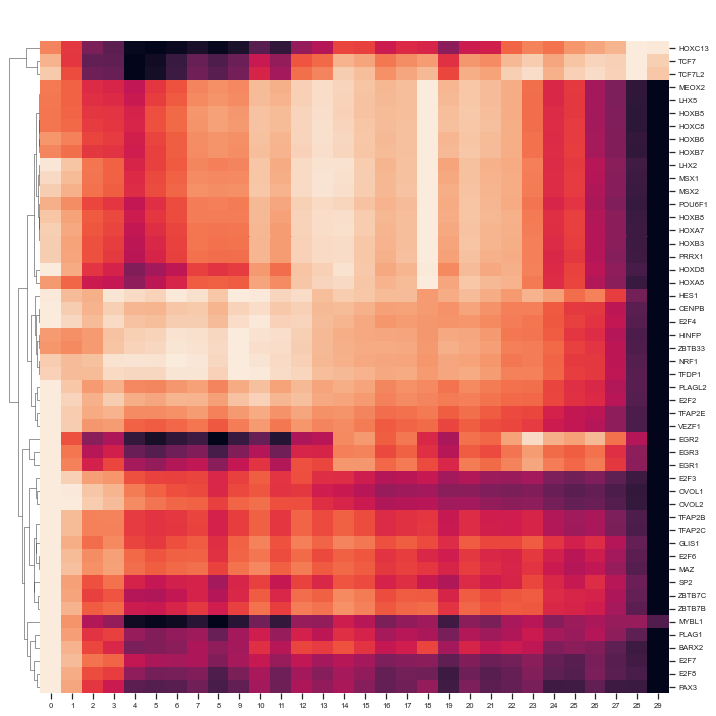

In [46]:
_TOPIC_=21
sns.clustermap(motif_state_predictions[motif_data.obs.factor_name.str.upper().isin(modeled_genes).values].iloc[topic_motif_corrs[_TOPIC_].values.argsort()[-50:]].iloc[:, cortex_timepoints], col_cluster=False,cbar_pos = None, standard_scale=0, dendrogram_ratio=0.05)

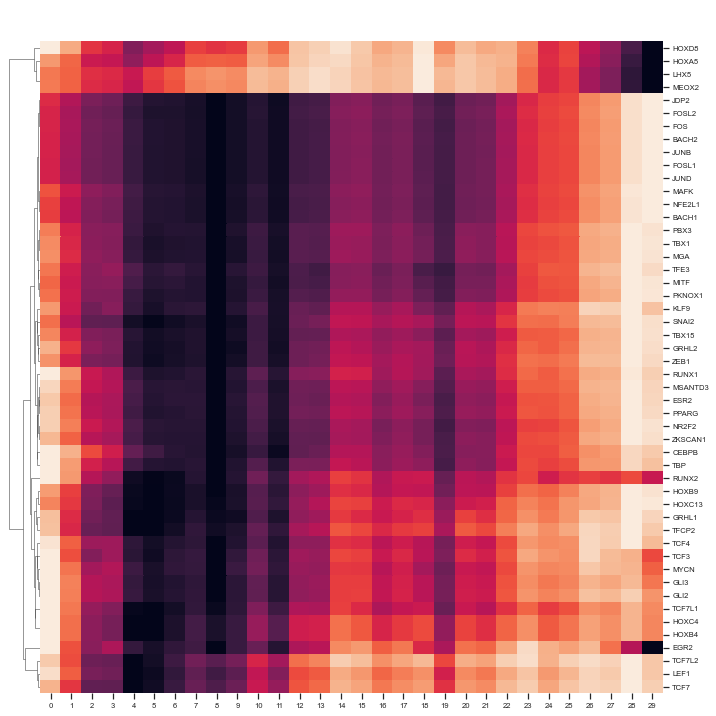

In [47]:
_TOPIC_=13
sns.clustermap(motif_state_predictions[motif_data.obs.factor_name.str.upper().isin(modeled_genes).values].iloc[topic_motif_corrs[_TOPIC_].values.argsort()[-50:]].iloc[:, cortex_timepoints], col_cluster=False,cbar_pos = None, standard_scale=0, dendrogram_ratio=0.05)

# Accessibility vs Expression

In [48]:
RPModel = importlib.reload(RPModel)
factory = RPModel.TopicRPFeatureFactory(atac_data.var[peak_mask][['chr','start','end']].values.tolist(), 'mm10', atac_data.varm['region_distribution'].T[:,peak_mask])

Loading gene info ...
Validation user-provided regions ...


### Cis-modeling

In [49]:
vi_models = dict()
for trace in tqdm.tqdm(glob.glob('./rp_estimation_models/vi/*_trace.pkl')):
    gene_name=os.path.basename(trace).split('_')[0]
    try:
        new_model = factory.get_gene_model(gene_name)
        new_model.load_trace(trace)
        vi_models[gene_name] = new_model
    except TypeError:
        pass

100%|██████████| 4861/4861 [01:26<00:00, 56.29it/s] 


In [50]:
accessibility_predicted_expression = []
for i in tqdm.tqdm(range(0,len(cortex_data),100)):
    j = i+100
    states = cortex_data.obsm['atac_composition'][i:j,:]
    region_distribution = access_model.predict(states)[:, factory.region_score_map]
    state_predictions = np.hstack([
        model.get_log_expr_rate(region_distribution[:, model.region_mask])[:, np.newaxis]
        for gene, model in vi_models.items()
    ])
    accessibility_predicted_expression.append(state_predictions)    

accessibility_predicted_expression = np.vstack(accessibility_predicted_expression)
accessibility_predicted_expression = pd.DataFrame(accessibility_predicted_expression, columns= list(vi_models.keys()))

100%|██████████| 59/59 [01:01<00:00,  1.05s/it]


In [51]:
region_distribution = access_model.predict(atac_states)[:, factory.region_score_map]
accessibility_state_predicted_expression = pd.DataFrame(np.hstack([
        model.get_log_expr_rate(region_distribution[:, model.region_mask])[:, np.newaxis]
        for gene, model in vi_models.items()
    ]), columns= list(vi_models.keys()))

In [52]:
shared_genes = np.intersect1d(np.intersect1d(list(vi_models.keys()), modeled_genes), raw_gene_expr.columns.values[np.log1p(raw_gene_expr.iloc[cortex_mapping, :].values.sum(0)) > 5])

In [53]:
gene_cis_corr = pd.Series(np.diag(topic_relevance_corr(accessibility_predicted_expression[shared_genes].values, expected_expr.iloc[cortex_mapping][shared_genes].values)), index = shared_genes)

<ipython-input-4-b13c10b5f5a8>:62: RuntimeWarning:

invalid value encountered in true_divide



### Trans-modeling

In [168]:
trans_model = RPModel.TransEffectModel(shared_genes).fit(cell_topic_weights=np.array(cortex_data.obsm['atac_composition']), gene_expr=raw_gene_expr.iloc[cortex_mapping][shared_genes].values, read_depth=read_depth[cortex_mapping], posterior_samples=50)

100%|██████████| 100/100 [06:35<00:00,  3.95s/it]


In [169]:
trans_predictions = pd.DataFrame(trans_model.get_log_expr_rate(cortex_data.obsm['atac_composition']), columns = shared_genes)
gene_trans_corr = np.diag(topic_relevance_corr(trans_predictions.values, cortex_data[:,shared_genes].layers['imputed']))

In [170]:
beta_matrix = pd.DataFrame(rna_model.beta, columns = modeled_genes)

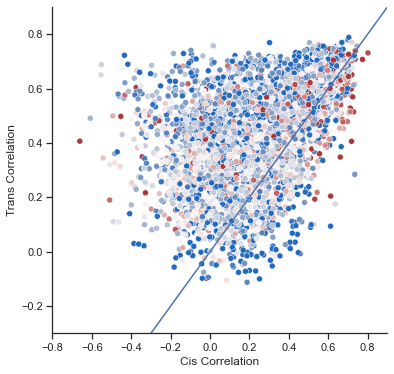

In [171]:
fig, ax = plt.subplots(1,1,figsize=(6,6))
TOPIC = 11
sns.scatterplot(y = gene_trans_corr, x = gene_cis_corr.values, hue = beta_matrix.iloc[TOPIC,:][shared_genes].values, palette='vlag', hue_norm=(0,np.quantile(np.maximum(beta_matrix.iloc[TOPIC,:][shared_genes].values, 0), 0.975)),
                    legend=False, ax= ax)
sns.lineplot(x = [-1,1], y = [-1,1], palette='Grays')
ax.set(xlim = (-0.8,0.9), ylim = (-0.3,0.9), xlabel = 'Cis Correlation', ylabel = 'Trans Correlation')
sns.despine()

In [163]:
cis_trans_corr = pd.DataFrame([gene_cis_corr.values, gene_trans_corr], columns = shared_genes, index = ['cis','trans']).T
cis_trans_corr['difference'] = cis_trans_corr.cis - cis_trans_corr.trans
cis_trans_corr = cis_trans_corr.dropna()

In [342]:
cis_trans_corr.sort_values('trans').tail(20)

,cis,trans,difference
NUDT13,0.675810,0.748329,-0.072520
PDZD2,0.584369,0.750327,-0.165957
ACER3,0.544094,0.752137,-0.208043
TRP63,0.517770,0.753917,-0.236147
CDK6,0.745857,0.754536,-0.008679
KMT2A,0.578424,0.755194,-0.176770
GNAQ,0.558513,0.755968,-0.197455
ARAP2,0.641786,0.757574,-0.115788
SLC38A2,0.574849,0.757692,-0.182843
SRSF10,0.523729,0.757783,-0.234054


In [ ]:
_gene = 'RUNX2'
sns.set(style = 'ticks')
fig,ax = plt.subplots(1,4,figsize=(20,4)) 
plot_umap(cortex_data, color_key=raw_gene_expr.iloc[cortex_mapping][_gene].values, ax = ax[0]) 
plot_umap(cortex_data, color_key=cortex_data[:, _gene].layers['imputed'].reshape(-1), ax = ax[1])
plot_umap(cortex_data, color_key=accessibility_predicted_expression[_gene].values, ax = ax[2])
plot_umap(cortex_data, color_key=trans_predictions[_gene], ax = ax[3])

# Accessibility-Expr Lag

In [54]:
shared_genes = np.intersect1d(np.intersect1d(list(vi_models.keys()), modeled_genes), 
                              raw_gene_expr.columns.values[np.log1p(raw_gene_expr.iloc[cortex_mapping, :].values.sum(0)) > 5])

In [55]:
import matplotlib

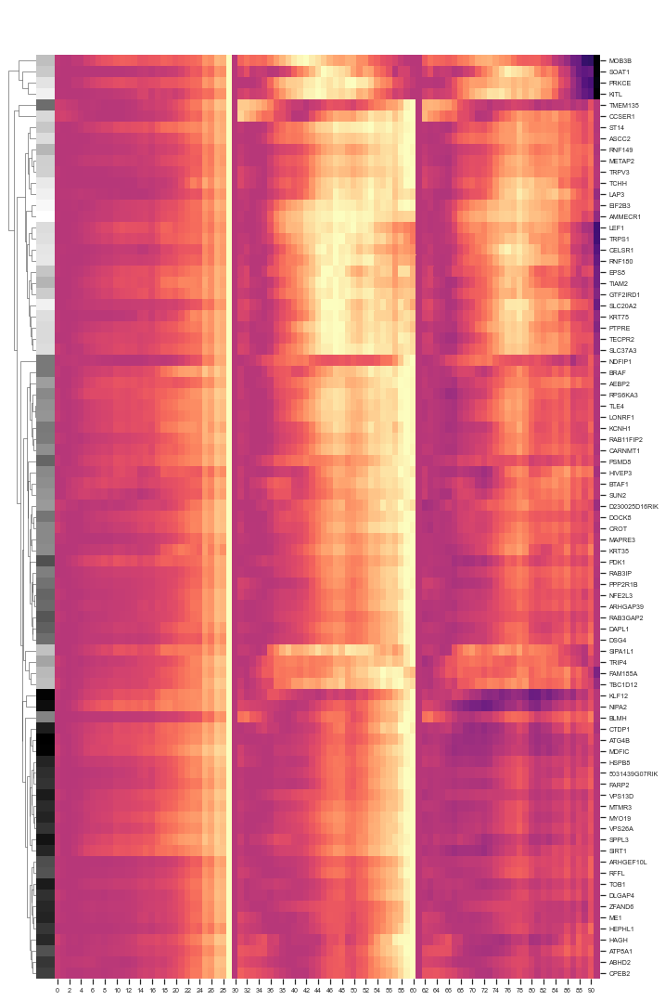

In [56]:
interval = cortex_timepoints
geneset = np.intersect1d(np.intersect1d(modeled_genes[rna_model.beta[18,:].argsort()[-100:]], shared_genes), gene_cis_corr[gene_cis_corr > 0.2].index.values)

expr = min_max_standardize(rna_state_predictions[geneset].T.values[:, interval])
acc = min_max_standardize(accessibility_state_predicted_expression[geneset].T.values[:, interval])
lag = acc - expr

lag_time = np.nan_to_num(np.maximum(lag, 0).sum(-1))
lag_time_color = sns.color_palette("Greys_r", as_cmap=True )(
        matplotlib.colors.Normalize(vmin=lag_time.min(), vmax=lag_time.max() )(lag_time))

sort_order = lag_time.argsort()

sns.set(style = 'ticks', font_scale = 0.65)
sns.clustermap(pd.DataFrame(np.concatenate([expr[sort_order], np.zeros((len(lag), 1)), acc[sort_order], np.zeros((len(lag), 1)), lag[sort_order]], -1), index = geneset[sort_order]).dropna(), 
               col_cluster=False, cmap = 'magma', dendrogram_ratio=0.05, cbar_pos = None, figsize = (10,15), row_colors=lag_time_color[sort_order], row_cluster = True)
plt.savefig('./expr_lag.png')

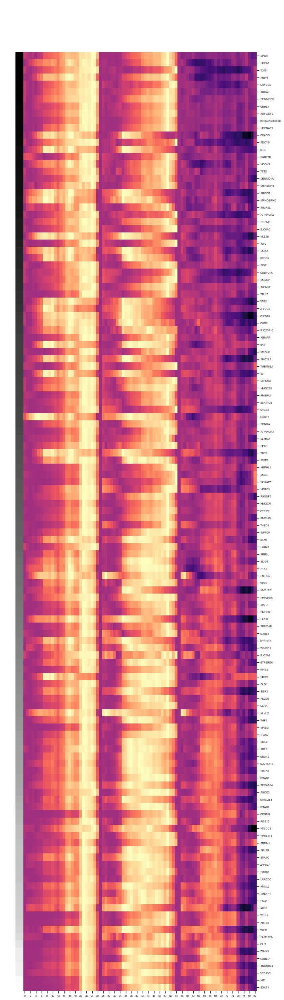

In [57]:
interval = medulla_timepoints
geneset = np.intersect1d(np.intersect1d(modeled_genes[rna_model.beta[11,:].argsort()[-200:]], shared_genes), gene_cis_corr[gene_cis_corr > 0.2].index.values)

expr = min_max_standardize(rna_state_predictions[geneset].T.values[:, interval])
acc = min_max_standardize(accessibility_state_predicted_expression[geneset].T.values[:, interval])
lag = acc - expr

lag_time = np.nan_to_num(np.maximum(lag, 0).sum(-1))
lag_time_color = sns.color_palette("Greys_r", as_cmap=True )(
        matplotlib.colors.Normalize(vmin=lag_time.min(), vmax=lag_time.max() )(lag_time))

sort_order = lag_time.argsort()

sns.set(style = 'ticks', font_scale = 0.65)
sns.clustermap(pd.DataFrame(np.concatenate([expr[sort_order], np.zeros((len(lag), 1)), acc[sort_order], np.zeros((len(lag), 1)), lag[sort_order]], -1), index = geneset[sort_order]).dropna(), 
               col_cluster=False, cmap = 'magma', dendrogram_ratio=0.05, cbar_pos = None, figsize = (10,35), row_colors=lag_time_color[sort_order], row_cluster = False)

In [59]:
cutoff = np.quantile(lag_time, 0.5)
tracking_genes, lagging_genes = geneset[lag_time < cutoff], geneset[lag_time >= cutoff]

In [60]:
print(*tracking_genes, sep = '\n')

5031439G07RIK
ABCA3
ADCY9
AHCYL2
ARFGEF2
ARID5B
ATP6V0A1
ATP6V0A2
CHD7
CPEB4
CRADD
CRYBG3
CYFIP2
DENND2C
DENND4A
DGKZ
EDNRA
ELMO2
EPG5
FNIP1
GRHL1
HEPHL1
HERC3
HMGCR
HMGCS1
HOOK1
HSPA5
HSPBAP1
ID1
IGSF3
IMMP2L
IMPACT
INF2
LYPD6B
MAPK8IP3
MGLL
MLLT6
MPHOSPH8
MROH1
MSMO1
NCKAP5
NPC1
NSMAF
OSBPL1A
OXCT1
PMEPA1
PTP4A1
RAB27B
RASSF6
RIN2
RNF149
SAT1
SERINC5
SKIL
SLC25A12
SLC6A8
STON2
TET2
TMEM63A
TOM1
TTC3
TTLL7
YAF2
ZFP516
ZFP704


### Branch-point decision analysis

In [58]:
beta_matrix = scale(rna_model.beta.T).T

/Users/alynch/miniconda3/envs/torch/lib/python3.8/site-packages/sklearn/preprocessing/_data.py:194: UserWarning:

Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.

/Users/alynch/miniconda3/envs/torch/lib/python3.8/site-packages/sklearn/preprocessing/_data.py:211: UserWarning:

Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 



In [123]:
cortex_and_medulla_genes = np.intersect1d(np.intersect1d(modeled_genes[np.unique(rna_model.beta.argsort(-1)[[11,18],-250:].reshape(-1))], shared_genes), 
                                          gene_cis_corr[gene_cis_corr > 0.2].index.values)
coef_index = pd.Series(data = np.arange(len(modeled_genes)), index = modeled_genes)[cortex_and_medulla_genes]

with open('tracks_data/gois.txt', 'w') as f:
    print('\n'.join(cortex_and_medulla_genes), file = f)

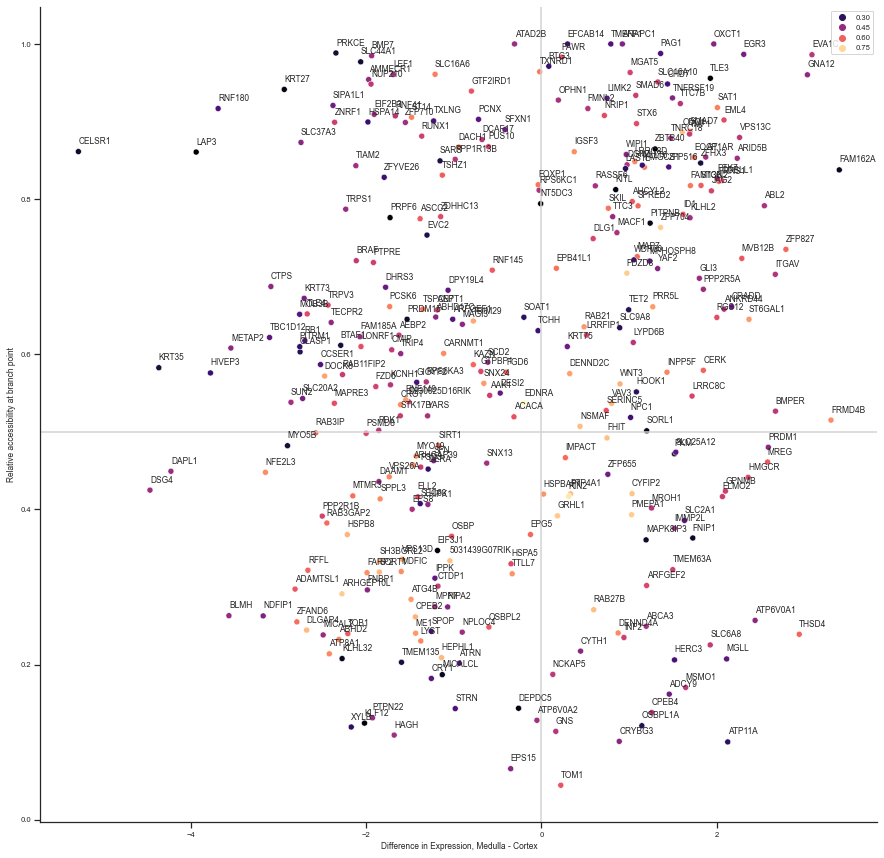

In [124]:
fig, ax = plt.subplots(1,1,figsize=(15,15))
sns.set(style = 'ticks', font_scale = 0.7)
y=min_max_standardize(accessibility_state_predicted_expression[cortex_and_medulla_genes].values[:50,:], axis = 0)[18, :]
x=(beta_matrix[11,:] - beta_matrix[18,:])[coef_index]
ax.axvline(0, color = 'lightgrey')
ax.axhline(0.5, color = 'lightgrey')
sns.scatterplot(y = y, x= x, ax = ax, hue = gene_cis_corr[cortex_and_medulla_genes].values, hue_norm=(0.2,0.8), palette='magma')
for i, (x_log, y_log) in enumerate(zip(x,y)):
    ax.text(x_log, y_log+0.01, s = cortex_and_medulla_genes[i])
sns.despine()
ax.set(xlabel = 'Difference in Expression, Medulla - Cortex', ylabel = 'Relative accessibility at branch point')
plt.show()

In [77]:
downregulated_cortex = modeled_genes[np.argsort(beta_matrix[18,:] - beta_matrix[11,:])[:100]]

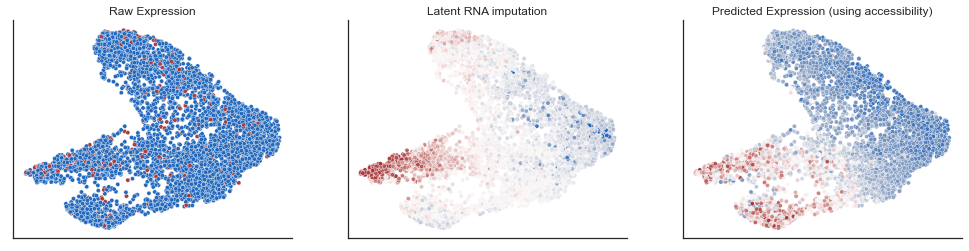

In [462]:
_gene = 'RAB11FIP2'

sns.set(style = 'ticks', font_scale = 1.0)
fig,ax = plt.subplots(1,3,figsize=(17,4)) 
plot_umap(cortex_data, color_key=raw_gene_expr.iloc[cortex_mapping][_gene].values, ax = ax[0]) 
#plot_umap(cortex_data, color_key=cortex_data[:, _gene].layers['imputed'].reshape(-1), ax = ax[1])
plot_umap(cortex_data, color_key=expected_expr.iloc[cortex_mapping][_gene].values, ax = ax[1])
try:
    plot_umap(cortex_data, color_key=accessibility_predicted_expression[_gene].values, ax = ax[2])
except KeyError:
    pass
for i, name in enumerate(['Raw Expression', 'Latent RNA imputation','Predicted Expression (using accessibility)']):
    ax[i].set(title  = name)

In [184]:
medulla_branch_activated_genes = cortex_and_medulla_genes[np.logical_and(x > -0.5, y > 0.5)]
cortex_branch_activated_genes = cortex_and_medulla_genes[np.logical_and(x < 0.5, y > 0.5)]
medulla_after_branch_genes = cortex_and_medulla_genes[np.logical_and(x > -0.5, y <= 0.5)]
cortex_after_branch_genes = cortex_and_medulla_genes[np.logical_and(x < 0.5, y <=0.5)]

In [91]:
cortex_data.obs.iloc[:,cortex_data.obs.columns.str.startswith('curve')].reset_index().fillna(-1).to_csv('tracks_data/pseudotime.tsv', sep = '\t', header= None, index = None)

# ISD Analysis

## Load in ChIP-seq data

In [56]:
#peak_mask = np.ones(atac_data.shape[1]).astype(np.bool)
peak_mask = (atac_data.var.n_cells > 150).values

In [361]:
from lisa import FromRegions 
from scipy.stats import fisher_exact

lisa_test = FromRegions('mm10', atac_data[:,peak_mask].var[['chr','start','end']].values.tolist())

Loading gene info ...
Validation user-provided regions ...


In [362]:
chipseq_matrix = lisa_test.data_interface.get_binding_data('ChIP-seq') 
num_hits = chipseq_matrix[0].sum(axis = 0) 
del chipseq_matrix

binding, peaks, genes = lisa_test.get_binding_matrix()
cistromedb = anndata.AnnData(binding, var = pd.DataFrame(genes), obs = pd.DataFrame(peaks, columns=['chr','start','end'])) 

'''inclusiveness=cistromedb.var.apply(lambda x : fishers_inclusiveness(overlaps=x['overlaps'], chip_hits = x['num_hits'], num_peaks=len(cistromedb), genome_size=2730871774, peak_size=300), axis = 1)
cistromedb.var['inclusiveness'] = inclusiveness

cistromedb.var = cistromedb.var.set_index('sample_id')
cistromedb = cistromedb.T

cistromedb = cistromedb[cistromedb.obs.inclusiveness < 0.01, :]
cistromedb = cistromedb[cistromedb.obs.factor.isin(np.intersect1d(cortex_data.var.index.values, cistromedb.obs.factor.values))]

def csr_to_lil(matrix):

    for row in range(matrix.shape[0]):
        yield list(matrix[row, :].indices)
        
TF_query_lists = list(csr_to_lil(cistromedb.X))

_, chipseq_corr = get_TF_corr(atac_data[np.random.choice(len(atac_data), size = 2000), :].obsm['cell_distribution'], np.array(atac_data[:, lisa_test.region_score_map].varm['region_distribution'].T), TF_query_lists)'''

/Users/alynch/miniconda3/envs/torch/lib/python3.8/site-packages/anndata/_core/anndata.py:119: ImplicitModificationWarning:

Transforming to str index.



"inclusiveness=cistromedb.var.apply(lambda x : fishers_inclusiveness(overlaps=x['overlaps'], chip_hits = x['num_hits'], num_peaks=len(cistromedb), genome_size=2730871774, peak_size=300), axis = 1)\ncistromedb.var['inclusiveness'] = inclusiveness\n\ncistromedb.var = cistromedb.var.set_index('sample_id')\ncistromedb = cistromedb.T\n\ncistromedb = cistromedb[cistromedb.obs.inclusiveness < 0.01, :]\ncistromedb = cistromedb[cistromedb.obs.factor.isin(np.intersect1d(cortex_data.var.index.values, cistromedb.obs.factor.values))]\n\ndef csr_to_lil(matrix):\n\n    for row in range(matrix.shape[0]):\n        yield list(matrix[row, :].indices)\n        \nTF_query_lists = list(csr_to_lil(cistromedb.X))\n\n_, chipseq_corr = get_TF_corr(atac_data[np.random.choice(len(atac_data), size = 2000), :].obsm['cell_distribution'], np.array(atac_data[:, lisa_test.region_score_map].varm['region_distribution'].T), TF_query_lists)"

In [363]:
cistromedb = cistromedb.T
cistromedb.obs.factor = cistromedb.obs.factor.str.upper()

In [365]:
cistromedb

AnnData object with n_obs × n_vars = 3657 × 185687
    obs: 'sample_id', 'factor', 'cell_line', 'cell_type', 'tissue'
    var: 'chr', 'start', 'end'

In [366]:
motif_data = cistromedb[:, lisa_test.region_score_map]
motif_data=motif_data[np.isin(motif_data.obs.factor.values, cortex_data[:, cortex_data.var.deviance_rank < 10000].var.index.values), :]
motif_matrix = motif_data.X.copy().tocsr()

In [369]:
use_qvalues = False

# Or load motif data

In [415]:
motif_data = pd.read_csv('../motif_stuff/fimo_out/fimo.txt', sep = '\t')

motif_ids = dict([(_id, i) for i, _id in enumerate(motif_data['#pattern name'].unique())])

coors={}
for motif_id, peak_num,q in zip(motif_data['#pattern name'].values, motif_data['sequence name'].values, motif_data['q-value'].values):
    key = (motif_ids[motif_id], peak_num)
    if not key in coors:
        coors[key] = q
    else:
        coors[key] = coors[key]*q

i,j = list(zip(*coors.keys()))

motif_intersection_matrix = sparse.coo_matrix((list(coors.values()), (i,j)), shape = (len(motif_ids),max(j)+1))

motif_intersection_matrix.shape

motif_ids_rev = {i : _id for _id,i in motif_ids.items()}
motif_axis = [motif_ids_rev[i] for i in range(len(motif_ids_rev))]

motif_factors = pd.read_csv('../motif_stuff/motif_metadata.tsv', sep = '\t', header = None)
motif_factors.columns = ['motif_id', 'factor_name']

motif_factors = motif_factors.set_index('motif_id').loc[motif_axis]

motif_data = anndata.AnnData(X = motif_intersection_matrix.tocsc()[:, atac_data.var.index.astype(int)], obs = motif_factors, var = atac_data.var)

motif_data.obs['num_hits'] = np.array((motif_data.X > 0).sum(-1)).reshape(-1)

motif_data

AnnData object with n_obs × n_vars = 741 × 334124
    obs: 'factor_name', 'num_hits'
    var: 'chr', 'start', 'end', 'seqnames', 'annotation', 'distanceToTSS', 'SYMBOL', 'n_cells', 'cortex_medulla_dp_pval', 'cortex_medulla_lfc', 'cortex_medulla_log10pval'

In [87]:
motif_data = anndata.read_h5ad('2021-02-01_motif_data.h5ad')

In [416]:
motif_data.obs['factor'] = motif_data.obs['factor_name']
motif_data = motif_data[:, peak_mask][:, lisa_test.region_score_map]

motif_data=motif_data[np.isin(motif_data.obs.factor.values, cortex_data[:, cortex_data.var.deviance_rank < 10000].var.index.values), :]
motif_matrix = motif_data.X.copy().tocsr()
use_qvalues = True

# ISD-over-time!

### Get timepoints from trajectory

In [368]:
tolerance = 0.1
timepoint_barcodes = []
#CORTEX
for i in np.linspace(0, cortex_data.obs['curve1'].dropna().max(), 20):
    curve_data = cortex_data.obs['curve1'].dropna()
    timepoint_barcodes.append( curve_data[np.logical_and(curve_data <(i+tolerance), curve_data > (i-tolerance))].index.values )
    
#MEDULLA
for i in np.linspace(5, cortex_data.obs['curve3'].dropna().max(), 8):
    curve_data = cortex_data.obs['curve3'].dropna()
    timepoint_barcodes.append( curve_data[np.logical_and(curve_data <(i+tolerance), curve_data > (i-tolerance))].index.values )

#IRS
for i in np.linspace(0, cortex_data.obs['curve2'].dropna().max(), 12):
    curve_data = cortex_data.obs['curve2'].dropna()
    timepoint_barcodes.append( curve_data[np.logical_and(curve_data <(i+tolerance), curve_data > (i-tolerance))].index.values )

In [81]:
RPModel = importlib.reload(RPModel)
factory = RPModel.TopicRPFeatureFactory(atac_data.var[peak_mask][['chr','start','end']].values.tolist(), 'mm10', atac_data.varm['region_distribution'].T[:,peak_mask])

Loading gene info ...
Validation user-provided regions ...


#### Load in RP Models

In [82]:
vi_models = dict()
for trace in tqdm.tqdm(glob.glob('./rp_estimation_models/vi/*_trace.pkl')):
    try:
        gene_name=os.path.basename(trace).split('_')[0]
        new_model = factory.get_gene_model(gene_name)
        new_model.load_trace(trace)
        vi_models[gene_name] = new_model
    except TypeError:
        pass

100%|██████████| 4861/4861 [00:55<00:00, 87.65it/s] 


In [319]:
gois = np.intersect1d(np.unique(np.concatenate([modeled_genes[rna_model.beta[topic,:].argsort()[-200:]]
    for topic in [12,8,3,11,15,1,18,10]])), list(vi_models.keys()))

### Do ISDs

In [370]:
datacube = [] 
for barcodes in timepoint_barcodes:

    mean_trans_state = cortex_data[barcodes, :].obsm['atac_composition'].mean(axis = 0)
    region_distribution = access_model.predict(np.array(mean_trans_state)[np.newaxis,:]).reshape(-1)
    #region_distribution = np.dot(np.array(mean_trans_state)[np.newaxis,:], atac_data.varm['region_distribution'].T).reshape(-1)

    isd_results = []
    for gene in tqdm.tqdm(gois):
        model = vi_models[gene]
        isd_results.append(
            model.get_rp_function().posterior_ISD(region_distribution[lisa_test.region_score_map], motif_matrix, qvalue=use_qvalues)[:, np.newaxis]
        )

    isd_results = np.hstack(isd_results)

    datacube.append(isd_results)

100%|██████████| 1236/1236 [01:12<00:00, 16.97it/s]


In [371]:
isd_over_time = np.transpose(np.concatenate(list(map(lambda x : x[np.newaxis, :,:], datacube)), axis = 0))

In [372]:
np.save('2021-03-11_cortex_isd.npy', isd_over_time)

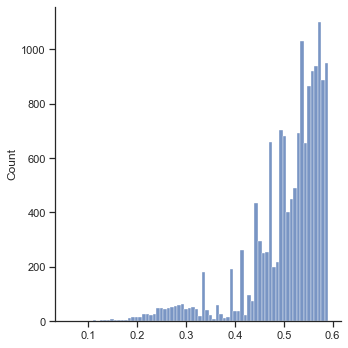

In [417]:
sns.displot(motif_data[motif_data.obs.factor == 'LEF1',:].X.data)

### Normalize ISD data

In [418]:
isd_over_time = np.load('2021-03-11_cortex_isd.npy')

factors = cistromedb.obs.factor.values

In [419]:
motif_data.obs['delta_RP_var'] = isd_over_time.var(axis = (0,2)) 

Trying to set attribute `.obs` of view, copying.


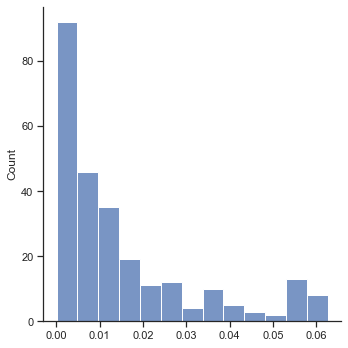

In [420]:
sns.displot(motif_data.obs.delta_RP_var.values)

In [421]:
successful_isds = np.logical_and((motif_data.obs.delta_RP_var > 0.0005).values, motif_data.obs.factor.isin(modeled_genes))

In [422]:
isd_over_time = isd_over_time[:, successful_isds, :] 
isd_over_time = isd_over_time/np.linalg.norm(isd_over_time, axis=(0,2))[np.newaxis, : , np.newaxis] 
isd_over_time = isd_over_time - isd_over_time.mean(axis = (1,2))[:, np.newaxis, np.newaxis]

isd_over_time.shape

(1236, 256, 40)

### Imputed State RNA

In [423]:
factor_names = motif_data[successful_isds].obs.factor.values

In [424]:
latent_rna_states = np.array([
    cortex_data[barcodes, :].obsm['cell_distribution'].mean(axis = 0)
    for barcodes in timepoint_barcodes
])

In [425]:
state_rna = pd.DataFrame(rna_model.predict(latent_rna_states), columns = modeled_genes)

In [426]:
tf_expr = state_rna[factor_names].values.T
goi_expr = state_rna[gois].values.T

In [427]:
def ISD_cov(isd_tensor, expr_matrix, tf_expr):

    covariance_matrix = ((isd_tensor - isd_tensor.mean(-1, keepdims = True)) * (expr_matrix - expr_matrix.mean(-1, keepdims = True))[:, np.newaxis, :]).sum(-1) / (expr_matrix.shape[-1] * expr_matrix.std(-1))[:, np.newaxis]

    #tf_coexpression_mask = topic_relevance_corr(tf_expr.T, expr_matrix.T) > 0.2
    #fix mask! > ISD and EXPR must not be anti-correlated
    
    isd_tf_expr_corr = np.nan_to_num(((isd_tensor - isd_tensor.mean(-1, keepdims = True)) * (tf_expr - tf_expr.mean(-1, keepdims = True))[np.newaxis,:, :]).sum(-1) / (tf_expr.shape[-1] * tf_expr.std(-1)[np.newaxis, :] * isd_tensor.std(-1)))
    
    tf_mask = isd_tf_expr_corr > 0.0

    return covariance_matrix * tf_mask

isd_covariance = ISD_cov(isd_over_time, goi_expr, tf_expr)

<ipython-input-427-1c7952bc40f2>:8: RuntimeWarning:

invalid value encountered in true_divide



In [428]:
'HOXC13' in factor_names

True

In [488]:
np.argwhere(factor_names == 'HOXC13')

array([[157]])

In [489]:
TF_SAMPLE = 157

In [490]:
np.argwhere(gois == 'HOXC13'), np.argwhere(gois == 'LEF1'), np.argwhere(gois == 'WNT3')

(array([[460]]), array([[542]]), array([[1190]]))

<AxesSubplot:>

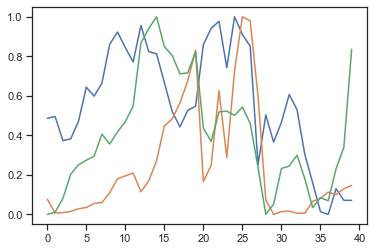

In [491]:
sns.lineplot(y = min_max_standardize(isd_over_time[1190, TF_SAMPLE, :]), x = np.arange(40))
sns.lineplot(y = min_max_standardize(goi_expr[1190,:]), x = np.arange(40))
sns.lineplot(y = min_max_standardize(tf_expr[TF_SAMPLE,:]), x= np.arange(40))

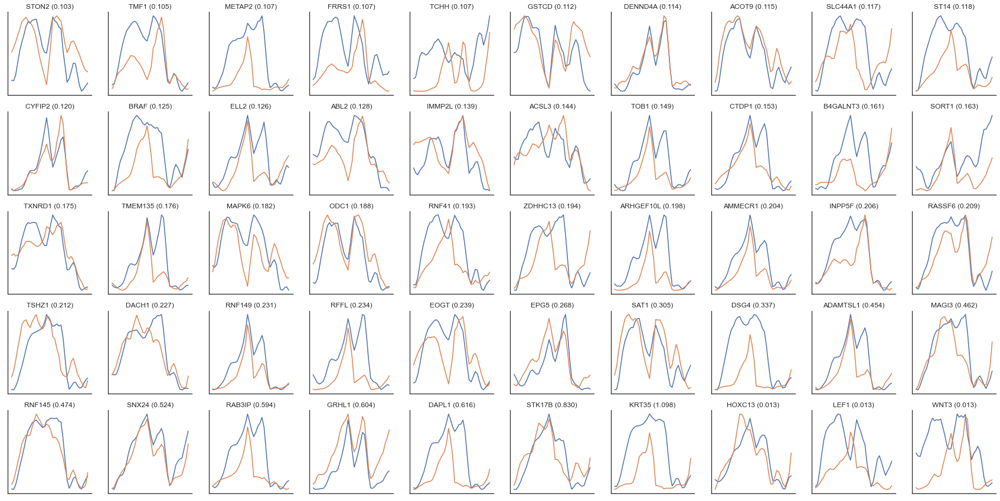

In [492]:
top_hits = list(np.argsort(isd_covariance[:, TF_SAMPLE])[-47:]) +[460,542,1190]

sns.set(font_scale=1.0, style = 'ticks') 

def plot(i,ax):

    sns.lineplot(x = np.arange(38), y = smooth(min_max_standardize(isd_over_time[top_hits[i], TF_SAMPLE, :]),3), ax = ax)
    sns.lineplot(x = np.arange(38), y = smooth(min_max_standardize(goi_expr[top_hits[i], :]),3), ax = ax)
    ax.set(xticks = [], yticks = [], title = gois[top_hits[i]] + ' ({})'.format(str(100*isd_covariance[top_hits[i], TF_SAMPLE])[:5]))

map_plot(len(top_hits)//10,10, plot, figsize=(30, 15))
sns.despine() 
plt.show()

In [503]:
np.argwhere(gois == 'KLF3')

array([], shape=(0, 1), dtype=int64)

In [501]:
factor_names[isd_covariance[1190, :].argsort()[-15:]]

array(['JUNB', 'HOXB7', 'MAFK', 'NR3C2', 'PRDM1', 'HOXC8', 'SREBF2',
       'STAT3', 'FOSL2', 'LEF1', 'NR2C1', 'LHX2', 'PPARG', 'RORA', 'RORC'],
      dtype=object)

In [448]:
from scipy.stats import mannwhitneyu

#cortex_genes = np.setdiff1d(gene_topic_corrs.sort_values(21).tail(50)[21].index.values, medulla_genes)
def LISA(query, isd_covariance, alternative = 'greater'): 
    
    pvals = [] 
    for q, b in zip(isd_covariance[query].T, isd_covariance[~query].T):
        try: 
            pvals.append(mannwhitneyu(q, b, alternative=alternative)[1]) 
        except Exception as err:
            print(err)
            pvals.append(1)
            
    return np.array(pvals)

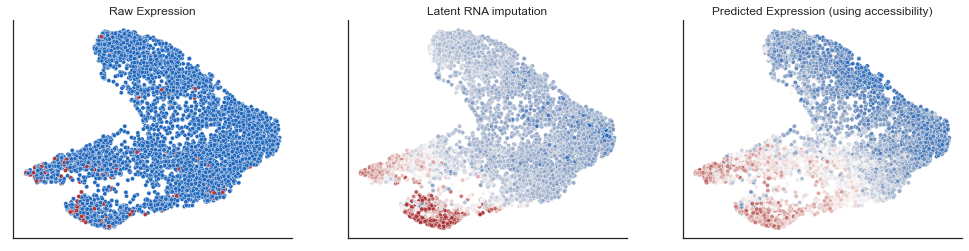

In [502]:
_gene = 'WNT3'

sns.set(style = 'ticks', font_scale = 1.0)
fig,ax = plt.subplots(1,3,figsize=(17,4)) 
plot_umap(cortex_data, color_key=raw_gene_expr.iloc[cortex_mapping][_gene].values, ax = ax[0]) 
#plot_umap(cortex_data, color_key=cortex_data[:, _gene].layers['imputed'].reshape(-1), ax = ax[1])
plot_umap(cortex_data, color_key=expected_expr.iloc[cortex_mapping][_gene].values, ax = ax[1])
try:
    plot_umap(cortex_data, color_key=accessibility_predicted_expression[_gene].values, ax = ax[2])
except KeyError:
    pass
for i, name in enumerate(['Raw Expression', 'Latent RNA imputation','Predicted Expression (using accessibility)']):
    ax[i].set(title  = name)

In [449]:
topic_1 = 18
topic_2 = 11
cortex_genes = modeled_genes[rna_model.beta[topic_1,:].argsort()[-200:]]
medulla_genes = modeled_genes[rna_model.beta[topic_2,:].argsort()[-200:]]
#cortex_genes = cortex_branch_activated_genes

cortex_pvals = LISA(np.isin(gois, cortex_genes), isd_covariance)
medulla_pvals = LISA(np.isin(gois, medulla_genes), isd_covariance)

cortex_factors = cortex_pvals.argsort()[:50]
medulla_factors = medulla_pvals.argsort()[:50]

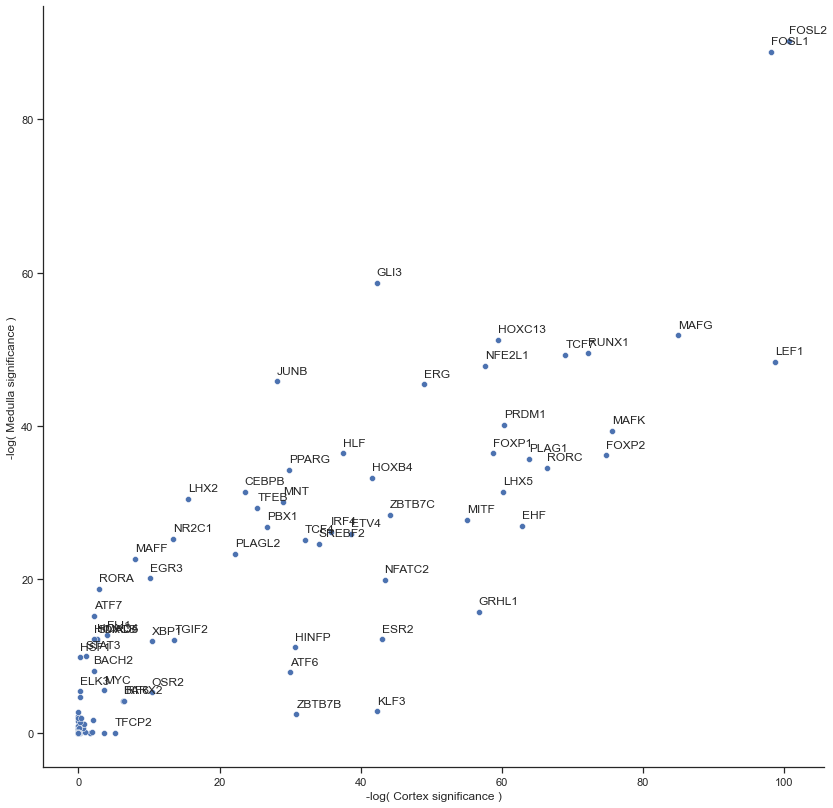

In [452]:
sns.set(font_scale = 1.0, style = 'ticks')
x = -np.log(cortex_pvals)
y = -np.log(medulla_pvals)
cortex_factor = x - y > 0
medulla_factor = y - x > 2
fig, ax = plt.subplots(1,1,figsize=(14,14))
sns.scatterplot(x = x, y = y, ax = ax)
for i, (x_log, y_log) in enumerate(zip(x,y)):
    if x_log > 5 or y_log > 5:
        ax.text(x_log, y_log+1, s = factor_names[i])
ax.set(xlabel = '-log( Cortex significance )', ylabel = '-log( Medulla significance )')
sns.despine()

In [438]:
beta_matrix = scale(rna_model.beta.T).T

/Users/alynch/miniconda3/envs/torch/lib/python3.8/site-packages/sklearn/preprocessing/_data.py:194: UserWarning:

Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.

/Users/alynch/miniconda3/envs/torch/lib/python3.8/site-packages/sklearn/preprocessing/_data.py:211: UserWarning:

Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 



In [439]:
def rotate(x, theta):
    theta = -theta
    return np.dot(x, np.array([[np.cos(theta), -np.sin(theta)],[np.sin(theta), np.cos(theta)]]))

'''x = np.random.rand(25,2)
z = rotate(x, np.pi/4)
sns.scatterplot(x[:,0], x[:,1])
sns.scatterplot(z[:,0], z[:,1])'''

z = rotate(np.concatenate([x[:,np.newaxis],y[:,np.newaxis]],1) - 5, np.pi/4)
factor_order = z[:,0].argsort()[z[z[:,0].argsort(),1] > 0]
factor_continuum = factor_names[factor_order]

topic_loadings = beta_matrix[:,pd.Series(np.arange(len(modeled_genes)), index = modeled_genes)[factor_continuum].values]
target_genes = np.array([', '.join(x) for x in gois[isd_covariance[:, factor_order].argsort(0)[-3:,:].T]])

topic_1_name, topic_2_name = 'Branch','Cortex'
influence_label = '< {} ---                (Influence)              --- {} >'.format(topic_1_name, topic_2_name)
expression_label = '< {} ---              (Expression)              --- {} >'.format(topic_1_name, topic_2_name)

data = pd.DataFrame([z[factor_order,0], topic_loadings[topic_2,:] - topic_loadings[topic_1,:], factor_continuum, target_genes, np.maximum(x,y)[factor_order].astype(np.float)],
                    index = [influence_label, expression_label, 'Factor', 'Targets', 'Significance']).T
data.Significance = data.Significance.astype(np.float)

fig = px.scatter(data, x = influence_label, y = expression_label, hover_data=['Factor','Targets'], text = 'Factor', size = 'Significance')
fig.update_traces(textposition='top center')

fig.update_layout(
    height=800,
    width =1600,
    title_text='Factor Expression vs. Influence',
    plot_bgcolor='rgba(0,0,0,0)',
)

fig.update_xaxes(showgrid=False,zeroline=True, zerolinecolor='lightgrey')
fig.update_yaxes(showgrid=False,zeroline=True, zerolinecolor='lightgrey')

fig.show()

### Differential ISD analysis

In [440]:
topic_1 = 18
topic_2 = 11

cortex_branch_pvals = LISA(np.isin(gois, cortex_branch_activated_genes), isd_covariance)
medulla_branch_pvals = LISA(np.isin(gois, medulla_branch_activated_genes), isd_covariance)
cortex_terminal_pvals = LISA(np.isin(gois, cortex_after_branch_genes), isd_covariance)
medulla_terminal_pvals = LISA(np.isin(gois, medulla_after_branch_genes), isd_covariance)

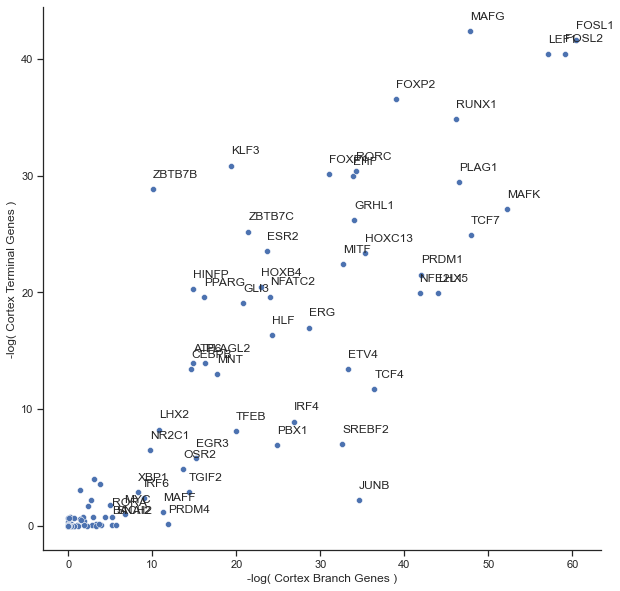

In [927]:
x = cortex_branch_pvals
y = cortex_terminal_pvals
x = -np.log(x)
y = -np.log(y)
fig, ax = plt.subplots(1,1,figsize=(10,10))
sns.scatterplot(x = x, y = y, ax = ax)
for i, (x_log, y_log) in enumerate(zip(x,y)):
    if x_log > 5 or y_log > 5:
        ax.text(x_log, y_log+1, s = factor_names[i])
ax.set(xlabel = '-log( Cortex Branch Genes )', ylabel = '-log( Cortex Terminal Genes )')
sns.despine()

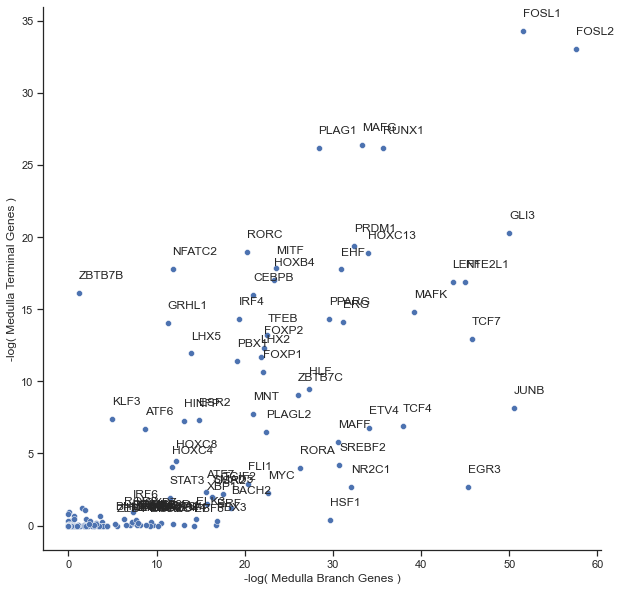

In [928]:
x = medulla_branch_pvals
y = medulla_terminal_pvals
x = -np.log(x)
y = -np.log(y)
fig, ax = plt.subplots(1,1,figsize=(10,10))
sns.scatterplot(x = x, y = y, ax = ax)
for i, (x_log, y_log) in enumerate(zip(x,y)):
    if x_log > 5 or y_log > 5:
        ax.text(x_log, y_log+1, s = factor_names[i])
ax.set(xlabel = '-log( Medulla Branch Genes )', ylabel = '-log( Medulla Terminal Genes )')
sns.despine()

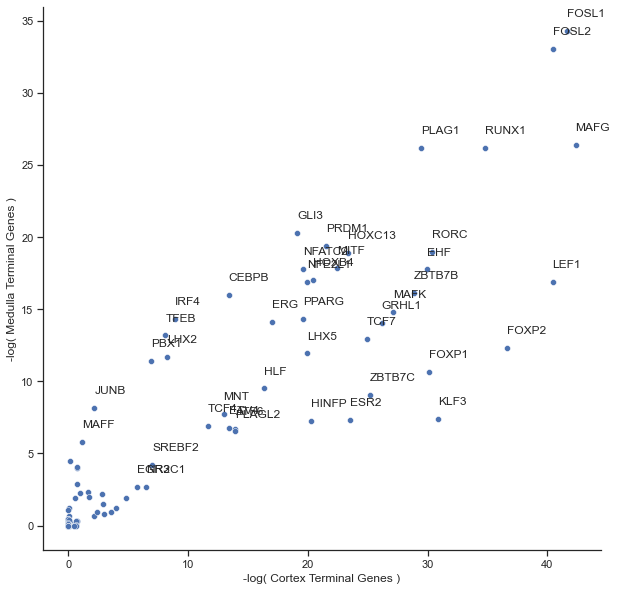

In [938]:
x = cortex_terminal_pvals
y = medulla_terminal_pvals
x = -np.log(x)
y = -np.log(y)
fig, ax = plt.subplots(1,1,figsize=(10,10))
sns.scatterplot(x = x, y = y, ax = ax)
for i, (x_log, y_log) in enumerate(zip(x,y)):
    if x_log > 5 or y_log > 5:
        ax.text(x_log, y_log+1, s = factor_names[i])
ax.set(xlabel = '-log( Cortex Terminal Genes )', ylabel = '-log( Medulla Terminal Genes )')
sns.despine()

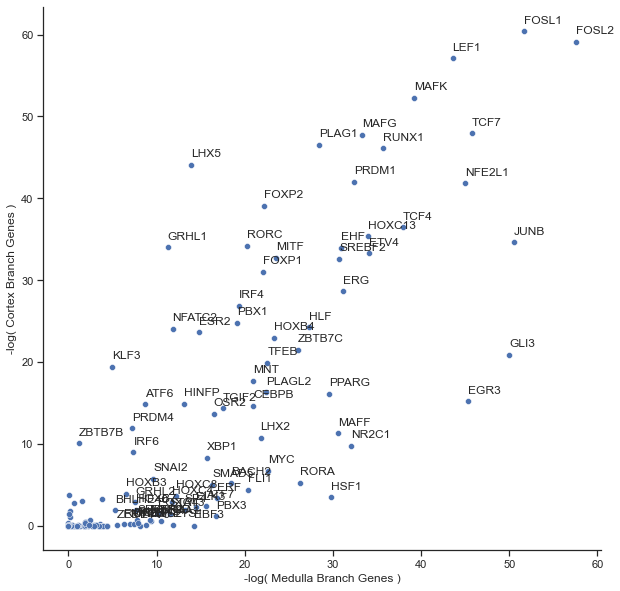

In [925]:
x = medulla_branch_pvals
y = cortex_branch_pvals
x = -np.log(x)
y = -np.log(y)
fig, ax = plt.subplots(1,1,figsize=(10,10))
sns.scatterplot(x = x, y = y, ax = ax)
for i, (x_log, y_log) in enumerate(zip(x,y)):
    if x_log > 5 or y_log > 5:
        ax.text(x_log, y_log+1, s = factor_names[i])
ax.set(xlabel = '-log( Medulla Branch Genes )', ylabel = '-log( Cortex Branch Genes )')
sns.despine()

In [456]:
def rotate(x, theta):
    theta = -theta
    return np.dot(x, np.array([[np.cos(theta), -np.sin(theta)],[np.sin(theta), np.cos(theta)]]))

'''x = np.random.rand(25,2)
z = rotate(x, np.pi/4)
sns.scatterplot(x[:,0], x[:,1])
sns.scatterplot(z[:,0], z[:,1])'''

z = rotate(np.concatenate([x[:,np.newaxis],y[:,np.newaxis]],1) - 5, np.pi/4)
factor_order = z[:,0].argsort()[z[z[:,0].argsort(),1] > 0]
factor_continuum = factor_names[factor_order]

topic_loadings = beta_matrix[:,pd.Series(np.arange(len(modeled_genes)), index = modeled_genes)[factor_continuum].values]
target_genes = np.array([', '.join(x) for x in gois[isd_covariance[:, factor_order].argsort(0)[-3:,:].T]])

topic_1_name, topic_2_name = 'Cortex','Medulla'
influence_label = '< {} ---                (Influence)              --- {} >'.format(topic_1_name, topic_2_name)
expression_label = '< {} ---              (Expression)              --- {} >'.format(topic_1_name, topic_2_name)

data = pd.DataFrame([z[factor_order,0], topic_loadings[topic_2,:] - topic_loadings[topic_1,:], factor_continuum, target_genes, np.maximum(x,y)[factor_order].astype(np.float)],
                    index = [influence_label, expression_label, 'Factor', 'Targets', 'Significance']).T
data.Significance = data.Significance.astype(np.float)

fig = px.scatter(data, x = influence_label, y = expression_label, hover_data=['Factor','Targets'], text = 'Factor', size = 'Significance')
fig.update_traces(textposition='top center')

fig.update_layout(
    height=800,
    width =1200,
    title_text='Factor Expression vs. Influence',
    plot_bgcolor='rgba(0,0,0,0)',
)

fig.update_xaxes(showgrid=False,zeroline=True, zerolinecolor='lightgrey')
fig.update_yaxes(showgrid=False,zeroline=True, zerolinecolor='lightgrey')

fig.show()

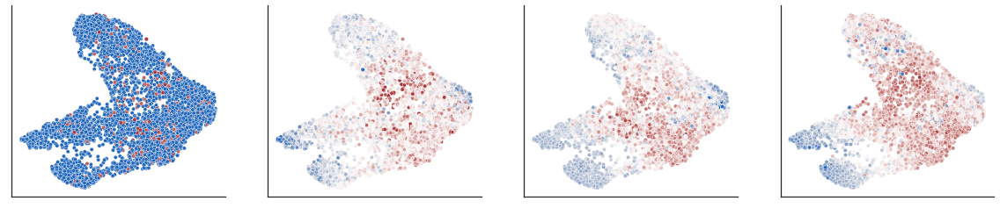

In [941]:
_gene = 'ID3'

fig,ax = plt.subplots(1,4,figsize=(20,4)) 
plot_umap(cortex_data, color_key=raw_gene_expr.iloc[cortex_mapping][_gene].values, ax = ax[0]) 
plot_umap(cortex_data, color_key=cortex_data[:, _gene].layers['imputed'].reshape(-1), ax = ax[1])
plot_umap(cortex_data, color_key=expected_expr.iloc[cortex_mapping][_gene].values, ax = ax[2])
try:
    plot_umap(cortex_data, color_key=accessibility_predicted_expression[_gene].values, ax = ax[3])
except KeyError:
    pass

'''isd_df = pd.DataFrame( isd_covariance[np.isin(gois, gene_topic_corrs.sort_values(1).tail(100).index.values)][:,np.argsort(np.array(pvals))[:60]], 
                      index = gois[np.isin(gois, gene_topic_corrs.sort_values(1).tail(100).index.values)], 
                      columns = factors[successful_isds][np.argsort(np.array(pvals))[:60]])'''

isd_df = pd.DataFrame(isd_covariance, index = gois, columns = motif_data[successful_isds].obs.factor.values)

TOP=50
group1_factors = most_extreme(fa.components_[1,:], upper=True, top = TOP)
group2_factors = most_extreme(fa.components_[4,:], upper=True, top = TOP)
group1_exclusive_factors = np.setdiff1d(group1_factors, group2_factors)
group2_exclusive_factors = np.setdiff1d(group2_factors, group1_factors)
shared_factors = np.intersect1d(group1_factors, group2_factors)

group1_genes = most_extreme(factors[:, 1], upper=True, top=TOP)
group2_genes = most_extreme(factors[:, 4], upper= True, top=TOP)
group1_exclusive_genes = np.setdiff1d(group1_genes, group2_genes)
group2_exclusive_genes = np.setdiff1d(group2_genes, group1_genes)
shared_genes = np.intersect1d(group1_genes, group2_genes)

gene_idx = np.concatenate([group1_exclusive_genes, group2_exclusive_genes, shared_genes])
tf_idx = np.concatenate([group1_exclusive_factors, group2_exclusive_factors, shared_factors])

isd_df = isd_df.iloc[gene_idx, tf_idx]

sns.set(font_scale = 0.75, style = 'ticks')
sns.clustermap(isd_df, cmap = 'vlag', center = 0, figsize=(20,20), method='ward', row_colors=['r']*len(group1_exclusive_genes) + ['b']*len(group2_exclusive_genes) + ['g']*len(shared_genes), 
               col_colors=['r']*len(group1_exclusive_factors) + ['b']*len(group2_exclusive_factors) + ['g']*len(shared_factors), dendrogram_ratio=0.05, cbar_pos=None)
plt.show()

## Graph Drawing

In [258]:
import networkx as nx

In [291]:
#differentiation_tfs = np.union1d(cortex_factors, medulla_factors)
#differentiation_genes = np.logical_or(np.isin(gois, cortex_genes), np.isin(gois, medulla_genes))

differentiation_tfs = cortex_factors
differentiation_genes = np.isin(gois, medulla_genes)
isd_df = pd.DataFrame(isd_covariance[differentiation_genes][:,differentiation_tfs], index = gois[differentiation_genes], columns = factor_names[differentiation_tfs])

In [294]:
edges = isd_df.melt(var_name='TF', value_name='covariance', ignore_index=False).reset_index().rename(columns = {'index' : 'Gene'}).groupby(['Gene','TF']).max().reset_index()

MIN_COV = edges.covariance.quantile(0.99)

edges = edges[edges.covariance >= MIN_COV]

G = nx.DiGraph()

for _, edge in edges.iterrows():
    if edge['covariance'] > MIN_COV:
        G.add_edge(edge['TF'], edge['Gene'], weight = np.abs(edge['covariance']))

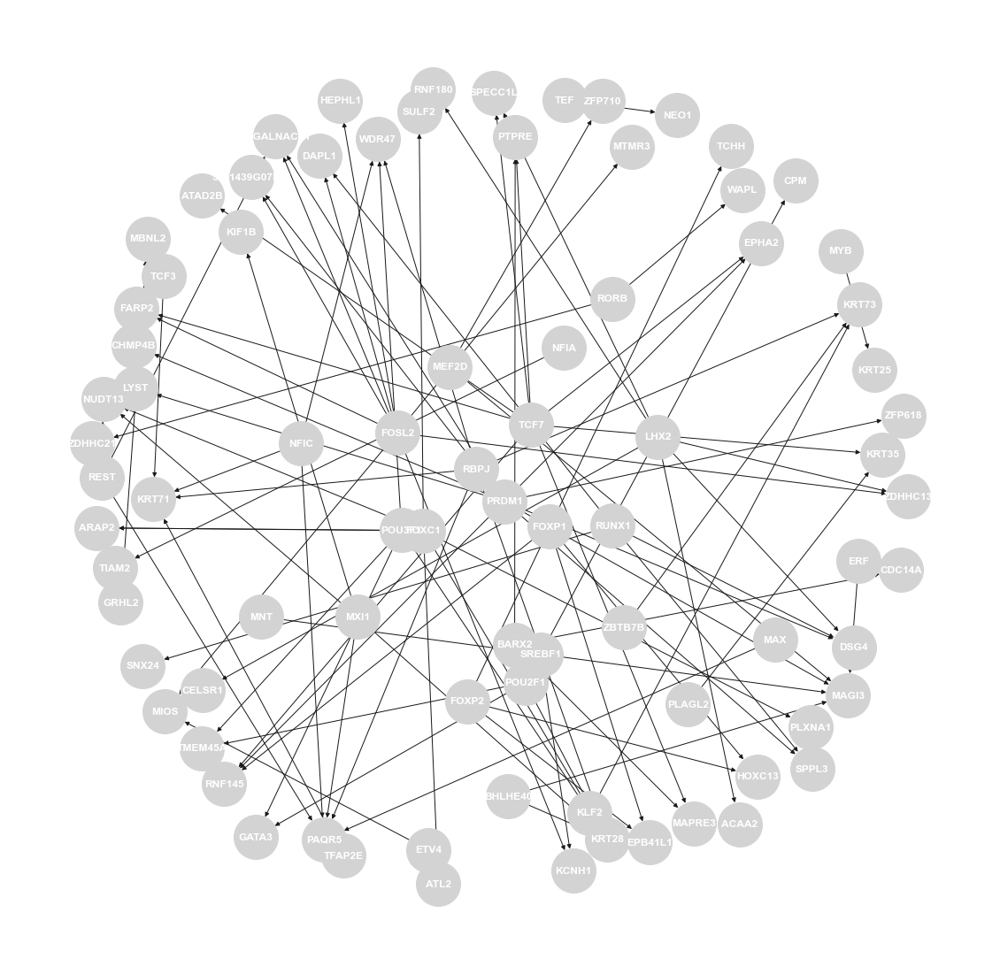

In [295]:
fig, ax = plt.subplots(1,1,figsize=(20,20))
nx.draw_spring(G, with_labels=True, font_weight='bold', ax =ax, node_color = 'lightgrey', node_size = 2500, font_color = 'w')

# Differential Peak Analysis

In [332]:
cortex_accessibility = atac_data[cortex_mapping, :]

In [338]:
cortex_data.obs.iloc[:, cortex_data.obs.columns.str.startswith('curve')] = cortex_data.obs.iloc[:, cortex_data.obs.columns.str.startswith('curve')].fillna(-1).values

In [ ]:
np.betw

In [360]:
clusters = np.array([np.zeros(len(cortex_data)), np.logical_and(cortex_data.obs.curve1.values <= 3, cortex_data.obs.curve1.values > 0), np.logical_and(cortex_data.obs.curve1.values <= 7, cortex_data.obs.curve1.values > 3), 
                        cortex_data.obs.curve1.values > 7, cortex_data.obs.curve3.values > 5]).T

In [361]:
clusters.shape, clusters

((5814, 5),
 array([[0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 1.],
        [0., 0., 0., 0., 0.],
        ...,
        [0., 1., 0., 0., 0.],
        [0., 0., 0., 0., 0.],
        [0., 0., 1., 0., 1.]]))

In [362]:
clusters = np.argmax(clusters, -1)

<AxesSubplot:>

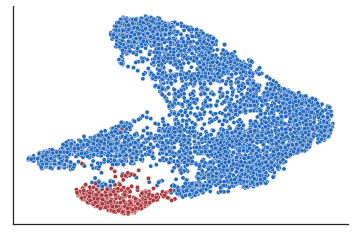

In [372]:
plot_umap(cortex_data, color_key=clusters == 4)

In [374]:
mask = np.logical_or(clusters == 3, clusters == 4)

In [375]:
cortex_accessibility = cortex_accessibility[mask]

In [376]:
cortex_accessibility.shape

(1275, 334124)

In [377]:
clusters = clusters[mask] - 3

In [465]:
from scipy.stats import norm

In [536]:
clusters = clusters.astype(np.bool)

In [569]:
C = cortex_accessibility.X[clusters, :].size
D = cortex_accessibility.X[~clusters, :].size
A = np.array(cortex_accessibility.X[clusters, :].sum(0)).reshape(-1)
B = np.array(cortex_accessibility.X[~clusters, :].sum(0)).reshape(-1)

In [578]:
from joblib import Parallel, delayed

In [581]:
def fisher(a,b,C,D):
    
    mat = np.array([[a, b],[C - a, D - b]])
    stat, pval = fisher_exact(mat)
    lfc = np.log2((a/(C-a)/(b/(D-b))))
    
    return pval, lfc

In [587]:
results = Parallel(10, verbose=3)(delayed(fisher)(a,b,C,D) for a,b in zip(A,B))

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    1.7s
[Parallel(n_jobs=10)]: Done 108 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done 268 tasks      | elapsed:    7.5s
[Parallel(n_jobs=10)]: Done 492 tasks      | elapsed:   12.6s
[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:   19.0s
[Parallel(n_jobs=10)]: Done 1132 tasks      | elapsed:   26.8s
[Parallel(n_jobs=10)]: Done 1548 tasks      | elapsed:   35.7s
[Parallel(n_jobs=10)]: Done 2028 tasks      | elapsed:   46.6s
[Parallel(n_jobs=10)]: Done 2572 tasks      | elapsed:   58.4s
[Parallel(n_jobs=10)]: Done 3180 tasks      | elapsed:  1.2min
[Parallel(n_jobs=10)]: Done 3852 tasks      | elapsed:  1.4min
[Parallel(n_jobs=10)]: Done 4588 tasks      | elapsed:  1.7min
[Parallel(n_jobs=10)]: Done 5388 tasks      | elapsed:  2.0min
[Parallel(n_jobs=10)]: Done 6252 tasks      | elapsed:  2.3min
[Parallel(n_jobs=10)]: Done 7180 tasks      | 

In [592]:
results = np.array(results)

In [595]:
np.save('./2021-04-09_diffpeak_pval-lfc.npz', results)

In [64]:
results = np.load('./2021-04-09_diffpeak_pval-lfc.npz.npy')

In [65]:
pvals, lfs = results[:,0], results[:,1]

In [72]:
np.logical_and(pvals < 0.01, np.isfinite(lfs)).sum()

7554

In [73]:
atac_data.var['cortex_medulla_dp_pval'] = pvals
atac_data.var['cortex_medulla_lfc'] = lfs
atac_data.var['cortex_medulla_log10pval'] = -np.log(pvals)

In [221]:
atac_data[:, np.logical_and(atac_data.var.cortex_medulla_dp_pval < 0.05, np.isfinite(atac_data.var.cortex_medulla_lfc))]\
    .var.reset_index()[['chr','start','end','peak_id','cortex_medulla_log10pval', 'cortex_medulla_lfc']].to_csv('tracks_data/diffpeaks.bed', index = None, header = None, sep = '\t')

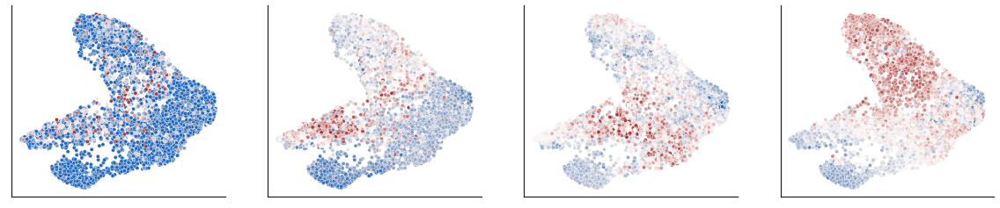

In [467]:
_gene = 'NOTCH1'

fig,ax = plt.subplots(1,4,figsize=(20,4)) 
plot_umap(cortex_data, color_key=raw_gene_expr.iloc[cortex_mapping][_gene].values, ax = ax[0]) 
plot_umap(cortex_data, color_key=cortex_data[:, _gene].layers['imputed'].reshape(-1), ax = ax[1])
plot_umap(cortex_data, color_key=expected_expr.iloc[cortex_mapping][_gene].values, ax = ax[2])
try:
    plot_umap(cortex_data, color_key=accessibility_predicted_expression[_gene].values, ax = ax[3])
except KeyError:
    pass

In [222]:
!bedtools closest -a <(sort -k1,1 -k2,2n tracks_data/diffpeaks.bed) -b <(sort -k1,1 -k2,2n tracks_data/filtered_genes.bed | cut -f1-4) -k 3 -d > tracks_data/closest_diffpeak_genes.bed

In [272]:
closest_gene = pd.read_csv('./tracks_data/closest_diffpeak_genes.bed', sep = '\t', header = None)
closest_gene.columns = ['chr','start','end','peak_id','log_10_pval','lfc','gene_chr','gene_start','gene_end','gene','distance']

In [273]:
#geneset = np.union1d(cortex_after_branch_genes, medula_after_branch_genes)
geneset = cortex_and_medulla_genes

In [274]:
closest_gene['cortex_or_medulla'] = closest_gene.gene.isin(geneset)

In [275]:
num_close = closest_gene.groupby('peak_id')['cortex_or_medulla'].sum().astype(np.bool).sum()

In [276]:
num_close

1727

In [277]:
num_genes = 19285

| Peaks close to genes | GOIS |
| ---------------------|------|
| Peaks not close      | ~GOI |

pval: 2.85e-263

| 1727 | 313 |
| -----| ----|
| 16719 | 18972 |

In [278]:
fisher_exact(np.array([[num_close, len(geneset)], 
                       [closest_gene.peak_id.nunique() - num_close, num_genes - len(geneset)]]))

(6.261102566057595, 2.8540391918743817e-263)

In [279]:
closest_gene = closest_gene[closest_gene.cortex_or_medulla]

In [280]:
colnames = ['cortex_after_branch','medulla_after_branch','cortex_branch','medulla_branch']

In [281]:
table = []
for geneset, name in zip([cortex_after_branch_genes, medulla_after_branch_genes, cortex_branch_activated_genes, medulla_branch_activated_genes],
                   colnames):
    closest_gene[name] = closest_gene.gene.isin(geneset)

In [282]:
np.argmax(closest_gene[colnames].values, -1).shape

(1799,)

In [283]:
closest_gene['type'] = np.array(colnames)[np.argmax(closest_gene[colnames].values, -1)]

In [284]:
closest_gene['cortex_up'] = closest_gene['lfc'] < 0

In [304]:
peak_type_counts = closest_gene.groupby(['cortex_up','type']).count()['chr'].reset_index().rename(columns = {'chr' : 'count', 'type' : 'gene class'})
peak_type_counts['interaction'] = ['Repressive','Repressive','Inductive','Inductive','Inductive','Inductive','Repressive','Repressive']
peak_type_counts.sort_values('count')

,cortex_up,gene class,count,interaction
6,True,medulla_after_branch,33,Repressive
7,True,medulla_branch,119,Repressive
2,False,medulla_after_branch,128,Inductive
4,True,cortex_after_branch,163,Inductive
0,False,cortex_after_branch,210,Repressive
5,True,cortex_branch,219,Inductive
1,False,cortex_branch,372,Repressive
3,False,medulla_branch,555,Inductive


In [300]:
for x in closest_gene[np.logical_and(~closest_gene.cortex_up, closest_gene['type'] == 'cortex_after_branch')][['chr','start','end']].values.tolist():
    print(*x, sep = '\t')

chr1	30838801	30839101
chr1	30841729	30842029
chr1	31019344	31019644
chr1	31050348	31050648
chr1	125443988	125444288
chr1	125676791	125677091
chr1	125730220	125730520
chr1	126002266	126002566
chr1	126144968	126145268
chr1	126282168	126282468
chr1	126535559	126535859
chr1	126550096	126550396
chr1	126559218	126559518
chr1	126608933	126609233
chr1	126618884	126619184
chr1	126658707	126659007
chr1	126687023	126687323
chr1	126736575	126736875
chr1	126755773	126756073
chr1	126799331	126799631
chr1	126811236	126811536
chr1	126817357	126817657
chr1	126817686	126817986
chr1	126818169	126818469
chr1	126862730	126863030
chr1	126872025	126872325
chr1	126904088	126904388
chr1	126915206	126915506
chr1	126954667	126954967
chr1	126973841	126974141
chr1	127087070	127087370
chr1	127103954	127104254
chr1	127105872	127106172
chr10	42723434	42723734
chr10	42723878	42724178
chr10	42745112	42745412
chr10	85136570	85136870
chr10	85355281	85355581
chr10	85387959	85388259
chr10	85420968	85421268
chr10	85495233	

In [239]:
with open('tracks_data/gois.txt', 'r') as f:
    track_genes = [x.strip() for x in f]

In [240]:
np.intersect1d(closest_gene.groupby('gene').count().sort_values('chr').tail(50).index.values, track_genes)

array(['ADAMTSL1', 'BMPER', 'DOCK8', 'FRMD4B', 'FRRS1', 'IGSF3', 'JAG2',
       'LRRC8C', 'MVB12B', 'NCKAP5', 'PTPRE', 'RAB27B', 'RUNX1', 'SMAD7',
       'SPRED2', 'ST14', 'STON2', 'TTLL7', 'TXNRD1', 'VAV3', 'ZFP704',
       'ZFP827'], dtype=object)